In [3]:
library(reticulate)
use_python("/opt/conda/bin/python3.10",required=T)
py_config()
library(rhdf5)
library(patchwork)
library(Seurat)
library(SeuratData)
library(ggplot2)
library(dplyr)
library(spatialLIBD)
source('BEER/BEER.R')

python:         /opt/conda/bin/python3.10
libpython:      /opt/conda/lib/libpython3.10.so
pythonhome:     /opt/conda:/opt/conda
version:        3.10.11 (main, Apr 20 2023, 19:02:41) [GCC 11.2.0]
numpy:          /opt/conda/lib/python3.10/site-packages/numpy
numpy_version:  1.22.4

NOTE: Python version was forced by use_python function

[1] "Welcome to BEER (v0.1.9)!"


In [4]:
AvailableData()

,Dataset,Version,Summary,species,system,ncells,tech,seurat,default.dataset,disk.datasets,other.datasets,notes,Installed,InstalledVersion
,<chr>,<pckg_vrs>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<pckg_vrs>
adiposeref.SeuratData,adiposeref,1.0.0,Azimuth Reference: adipose,human,adipose,160075,scRNA-seq and sNuc-seq,NA,NA,NA,NA,NA,FALSE,NA
bmcite.SeuratData,bmcite,0.3.0,30k Bone Marrow Cells,human,bone marrow,30672,NA,3.2.2,NA,NA,NA,NA,FALSE,NA
bonemarrowref.SeuratData,bonemarrowref,1.0.0,Azimuth Reference: bonemarrow,human,bonemarrow,297627,10x v2,NA,NA,NA,NA,NA,FALSE,NA
cbmc.SeuratData,cbmc,3.1.4,scRNAseq and 13-antibody sequencing of CBMCs,human,CBMC (cord blood),8617,CITE-seq,3.1.4,raw,processed,NA,NA,FALSE,NA
celegans.embryo.SeuratData,celegans.embryo,0.1.0,6k C. elegans embryos from Packer and Zhu et al (2019),C. elegans,embryo,6188,NA,NA,raw,NA,NA,NA,FALSE,NA
fetusref.SeuratData,fetusref,1.0.0,Azimuth Reference: fetus,human,fetus,377456,NA,NA,NA,NA,NA,NA,FALSE,NA
hcabm40k.SeuratData,hcabm40k,3.0.0,"40,000 Cells From the Human Cell Atlas ICA Bone Marrow Dataset",human,bone marrow,40000,10x v2,NA,raw,NA,NA,NA,FALSE,NA
heartref.SeuratData,heartref,1.0.0,Azimuth Reference: heart,human,heart,656509,scRNA-seq and sNuc-seq,NA,NA,NA,NA,NA,FALSE,NA
humancortexref.SeuratData,humancortexref,1.0.0,Azimuth Reference: humancortex,human,motor cortex,76533,NA,NA,NA,NA,NA,NA,FALSE,NA


In [5]:
# ?stxBrain

In [6]:
brain <- LoadData("stxBrain",type='anterior1')

In [4]:
tes_brain <- readRDS('dataset/GraphST/Mouse_Brain_Serial_Section_1_Sagittal-Anterior_10xvisium.rds')

In [5]:
tes_brain

An object of class Seurat 
31053 features across 2696 samples within 1 assay 
Active assay: Spatial (31053 features, 0 variable features)
 1 image present: image

In [17]:
fig <- GetImage(tes_brain, mode='raster')

In [18]:
typeof(fig)

[1] "character"

In [20]:
fig

       [,1]      [,2]      [,3]      [,4]      [,5]      [,6]      [,7]     
  [1,] "#B8BDBB" "#B8BCBA" "#B8BBBA" "#B8BCBB" "#B8BCBB" "#B8BCBB" "#B8BCBB"
  [2,] "#B8BCBA" "#B7BCBA" "#B8BBBA" "#B8BCBB" "#B8BBBB" "#B8BCBB" "#B8BCBB"
  [3,] "#B8BCBA" "#B8BCBA" "#B7BBBA" "#B8BCBB" "#B8BCBB" "#B8BCBB" "#B8BBBA"
  [4,] "#B7BCBA" "#B8BCBA" "#B8BCBA" "#B8BCBB" "#B8BCBA" "#B8BCBA" "#B8BCBB"
  [5,] "#B7BCBA" "#B7BCBA" "#B7BCBA" "#B7BCBA" "#B8BCBA" "#B8BCBB" "#B8BDBB"
  [6,] "#B7BCBA" "#B7BCBA" "#B8BCBA" "#B8BDBA" "#B8BCBA" "#B8BCBA" "#B8BCBB"
  [7,] "#B7BCBA" "#B7BCBA" "#B7BCBA" "#B8BCBA" "#B8BDBB" "#B8BDBA" "#B8BDBB"
  [8,] "#B7BCBA" "#B7BCBA" "#B7BBBA" "#B8BCBB" "#B8BDBB" "#B8BCBA" "#B8BCBA"
  [9,] "#B8BCBB" "#B8BCBB" "#B8BCBB" "#B8BCBB" "#B9BCBC" "#B9BCBB" "#B9BCBA"
 [10,] "#B8BCBB" "#B8BCBB" "#B8BBBB" "#B8BCBB" "#B9BCBB" "#B8BCBB" "#B9BCBA"
 [11,] "#B7BBBA" "#B7BBBA" "#B8BBBA" "#B8BCBB" "#B9BCBB" "#B8BCBB" "#B8BCBB"
 [12,] "#B7BCBB" "#B8BBBB" "#B8BBBB" "#B8BCBB" "#B8BCBB" "#B7BBBA" "#B8BCBB"

In [19]:
dim(fig)

[1] 599 600

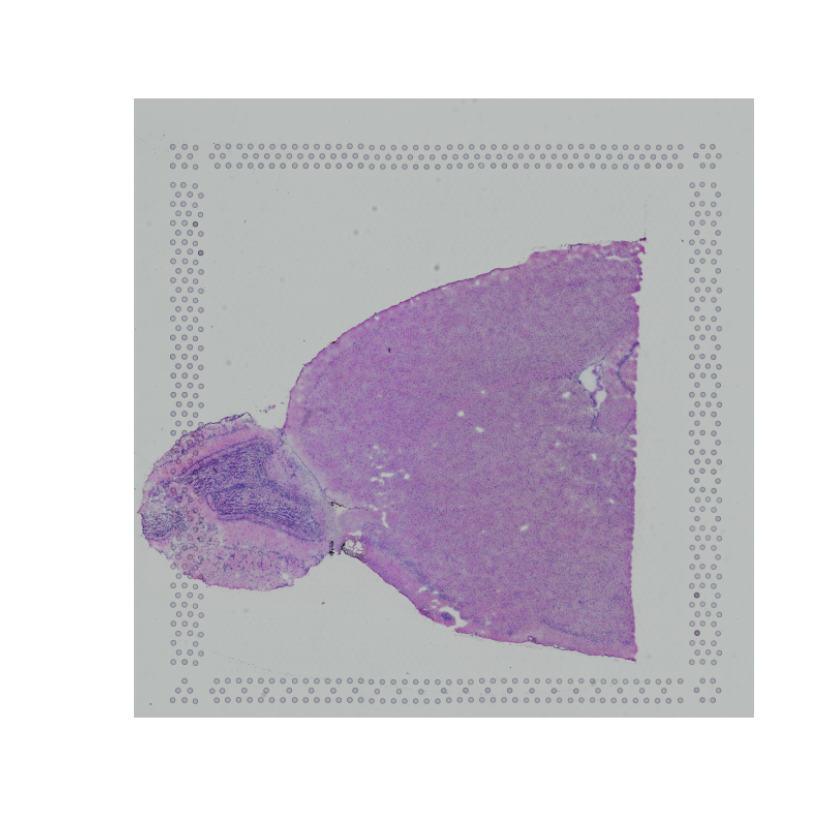

In [21]:
plot(fig)

In [29]:
brain

An object of class Seurat 
31053 features across 2696 samples within 1 assay 
Active assay: Spatial (31053 features, 2000 variable features)
 1 dimensional reduction calculated: pca
 1 image present: anterior1

In [30]:
coord <- GetTissueCoordinates(brain)
coord

,imagerow,imagecol
,<dbl>,<dbl>
AAACAAGTATCTCCCA-1,385.9725,438.95010
AAACACCAATAACTGC-1,441.6351,143.95870
AAACAGAGCGACTCCT-1,163.3735,410.49915
AAACAGCTTTCAGAAG-1,342.7022,108.38210
AAACAGGGTCTATATT-1,367.4355,122.63339
AAACATGGTGAGAGGA-1,460.2238,76.41997
AAACATTTCCCGGATT-1,454.0275,421.13598
AAACCGGGTAGGTACC-1,336.5060,175.92083
AAACCGTTCGTCCAGG-1,398.3649,225.69708


In [11]:
colnames(brain[[]])

[1] "orig.ident"       "nCount_Spatial"   "nFeature_Spatial" "slice"           
[5] "region"

In [26]:
brain <- FindVariableFeatures(brain)
brain <- ScaleData(brain)
brain <- RunPCA(brain)
brain <- FindNeighbors(brain)
brain <- FindClusters(brain)
# brain <- RunUMAP(brain)

Centering and scaling data matrix

PC_ 1 
Positive:  Apod, Plp1, Mobp, Trf, Mbp, Cldn11, Gfap, Mog, Ermn, Mal 
	   Plekhb1, Mag, Ugt8a, Cnp, Aspa, Ppp1r14a, Gatm, Bcas1, Gsn, Evi2a 
	   Anln, Tmem88b, Tspan2, Fa2h, Car14, Gpr37, Opalin, Serpinf1, Pdlim2, Bmp6 
Negative:  Aldoa, Calm1, Rab3a, Calm2, Rtn1, Snrpn, Snap25, Rtn3, Vamp2, Gpm6a 
	   Stmn3, Dnm1, Dynll1, Gng3, Ywhah, Stxbp1, Atp6v1b2, Ywhag, Nsf, Klc1 
	   Syt1, Atp1b1, Atp6v1g2, Mdh1, Ywhaz, Syp, Clstn1, Basp1, Mllt11, Prkar1b 
PC_ 2 
Positive:  1110008P14Rik, Cck, 3110035E14Rik, Lingo1, Adcy1, Osbpl1a, Dkk3, Mical2, Stx1a, Rtn4r 
	   Nrgn, Slc17a7, Nrn1, Gabbr2, Gm11549, Tbr1, Rph3a, Neurod2, Sv2b, Epop 
	   Satb2, Zfp365, Scn1b, Mal2, Trbc2, Enc1, Olfm2, Vsnl1, Cabp1, Olfm1 
Negative:  Meis2, Pcp4l1, Pbx3, Gad1, Gpsm1, Tshz1, Synpr, Gng4, Ptpro, Pcbp3 
	   Shisa8, Sp9, Syt6, Inpp5j, Fam102b, Slc32a1, Gprc5b, Dlx1, Ablim3, Cacng5 
	   Dclk2, Myo16, Csdc2, Eml5, Dlx5, H3f3b, Selenom, Gm13889, Ppp1cc, Gad2 
PC_ 3 
Positive:  P

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2696
Number of edges: 72024

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8741
Number of communities: 15
Elapsed time: 0 seconds


ERROR: Error in RunUMAP.Seurat(brain): Please specify one of dims, features, or graph


In [27]:
colnames(brain[[]])

[1] "orig.ident"          "nCount_Spatial"      "nFeature_Spatial"   
[4] "slice"               "region"              "Spatial_snn_res.0.8"
[7] "seurat_clusters"

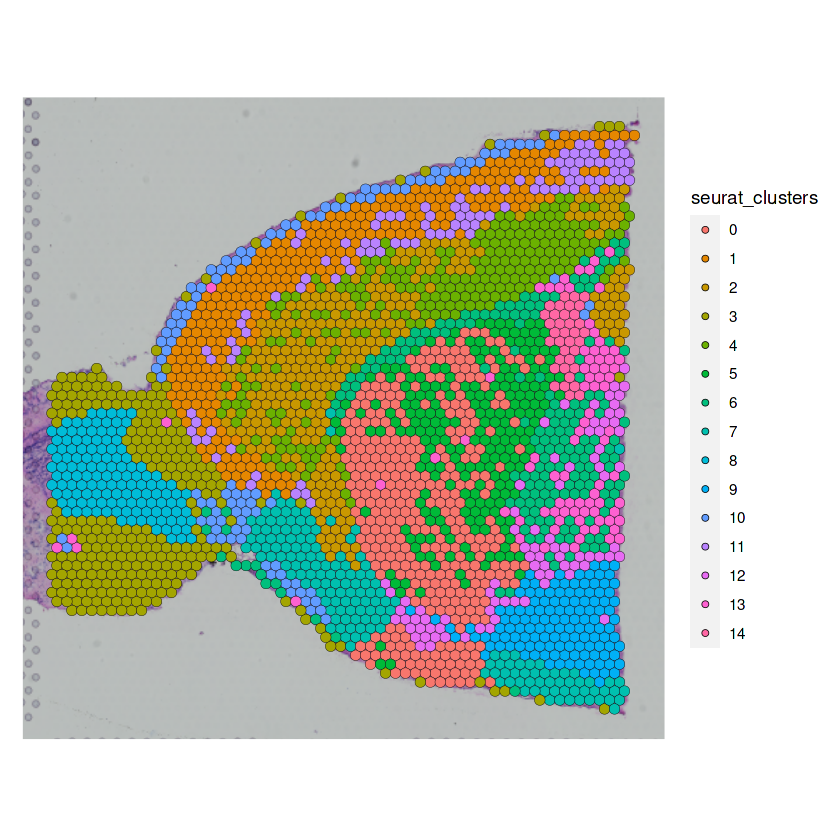

In [28]:
plot2 <- SpatialDimPlot(brain, group.by = 'seurat_clusters')
plot2

In [22]:
brain2 <- LoadData('stxBrain',type='posterior1')
brain3 <- LoadData('stxBrain',type='anterior2')
brain4 <- LoadData('stxBrain',type='posterior2')

In [23]:
fig1 <- GetImage(brain2, mode='raster')

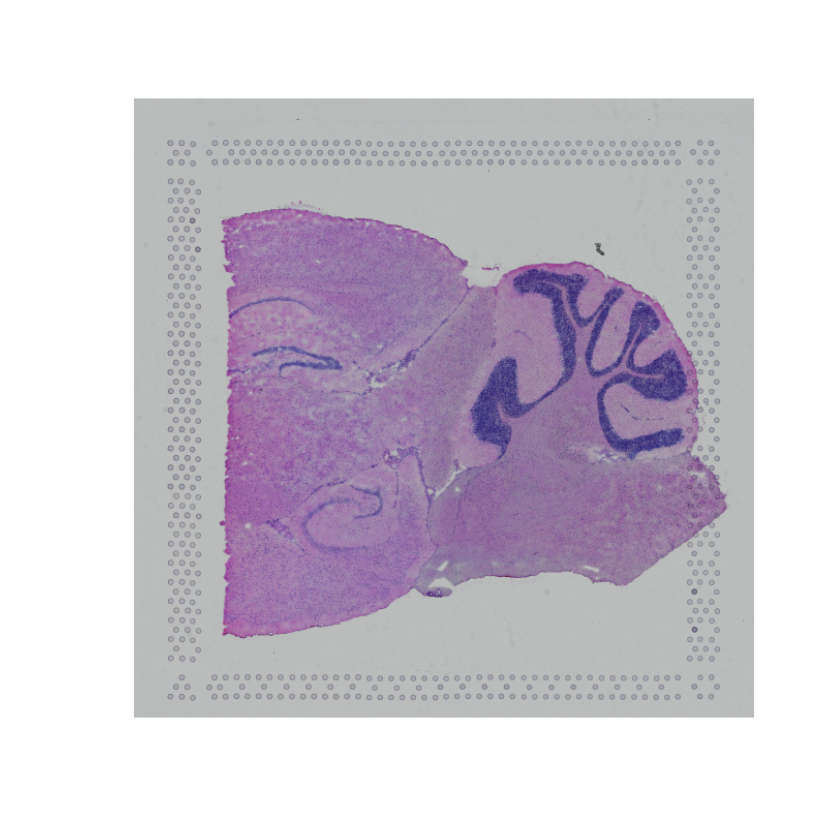

In [24]:
plot(fig1)

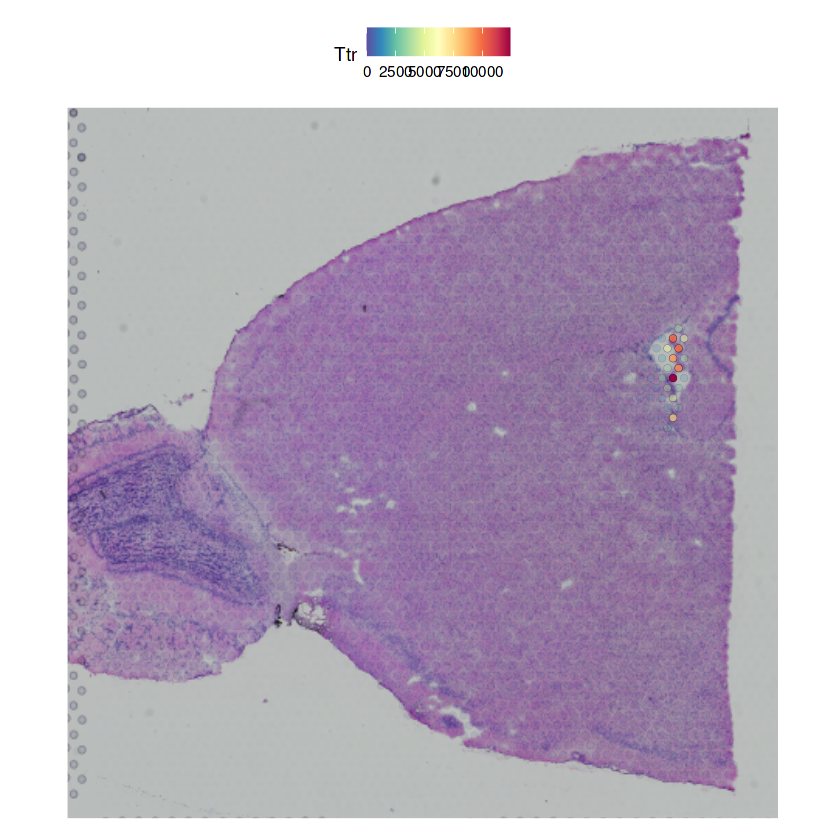

In [38]:
plot2 <- SpatialFeaturePlot(tes_brain, features = "Ttr", pt.size.factor = 1, alpha = c(0.1, 1))
plot2

In [27]:
length(Cells(brain2))

[1] 3353

In [29]:
GetTissueCoordinates(brain2)

,imagerow,imagecol
,<dbl>,<dbl>
AAACAAGTATCTCCCA-1,382.6162,436.5749
AAACACCAATAACTGC-1,438.2788,141.4802
AAACAGAGCGACTCCT-1,159.9139,408.1756
AAACAGCTTTCAGAAG-1,339.2943,105.9036
AAACAGGGTCTATATT-1,364.0275,120.1549
AAACATTTCCCGGATT-1,450.6713,418.8124
AAACCCGAACGAAATC-1,351.6868,482.8399
AAACCGGAAATGTTAA-1,407.3494,514.8021
AAACCGGGTAGGTACC-1,333.0981,173.4940


In [28]:
brain2

An object of class Seurat 
31053 features across 3353 samples within 1 assay 
Active assay: Spatial (31053 features, 0 variable features)
 1 image present: posterior1

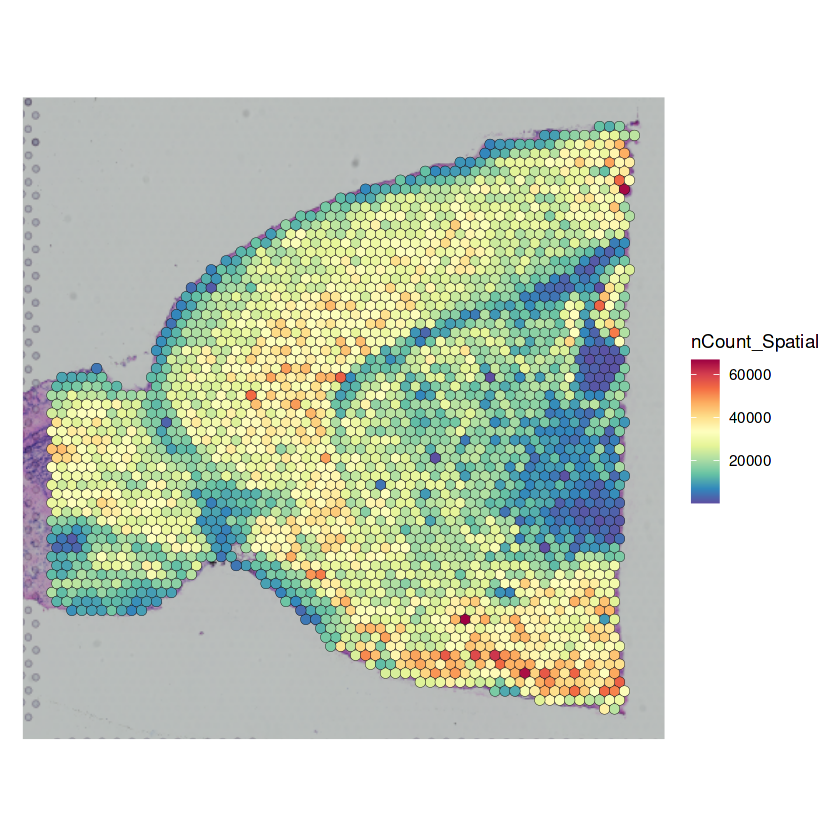

In [6]:
plot2 <- SpatialFeaturePlot(brain, features = "nCount_Spatial") + theme(legend.position = "right")
plot2

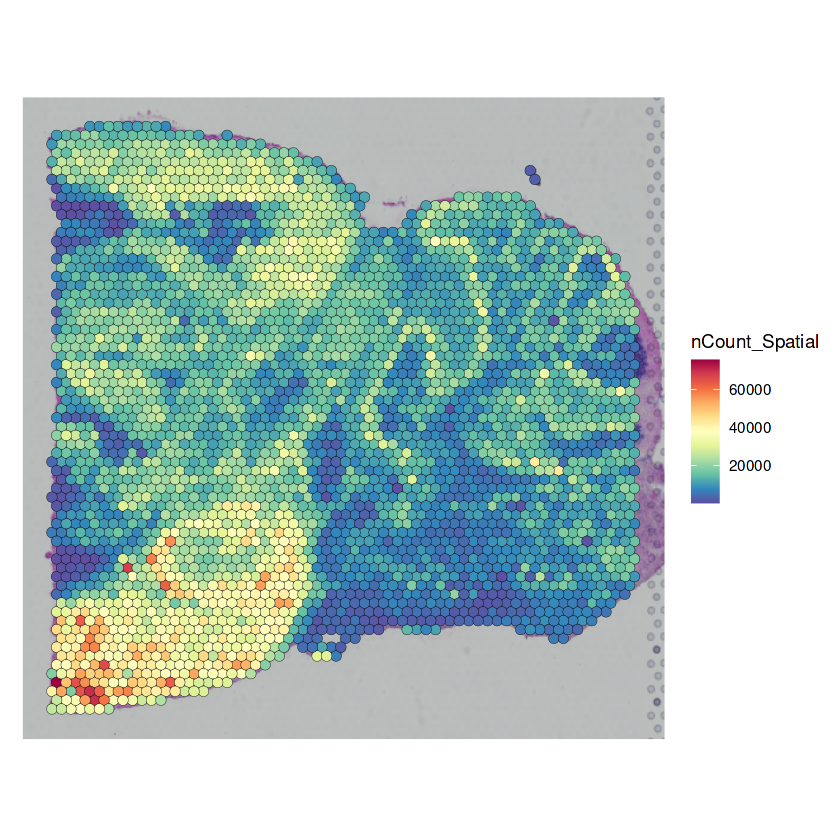

In [7]:
plot3 <- SpatialFeaturePlot(brain2, features = "nCount_Spatial") + theme(legend.position = "right")
plot3

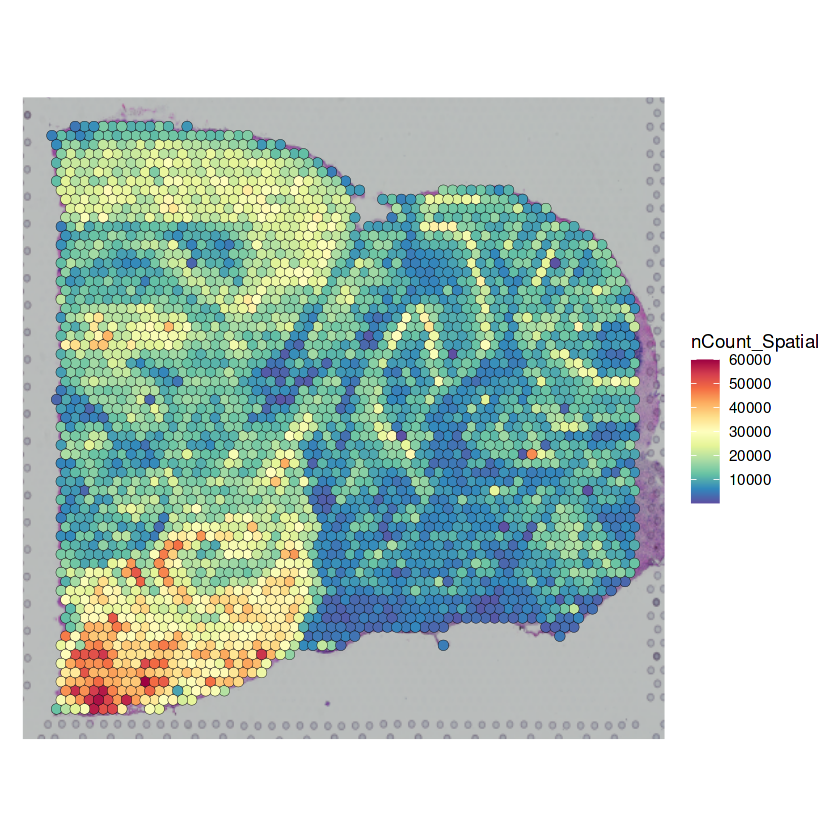

In [8]:
plot5 <- SpatialFeaturePlot(brain4, features = "nCount_Spatial") + theme(legend.position = "right")
plot5

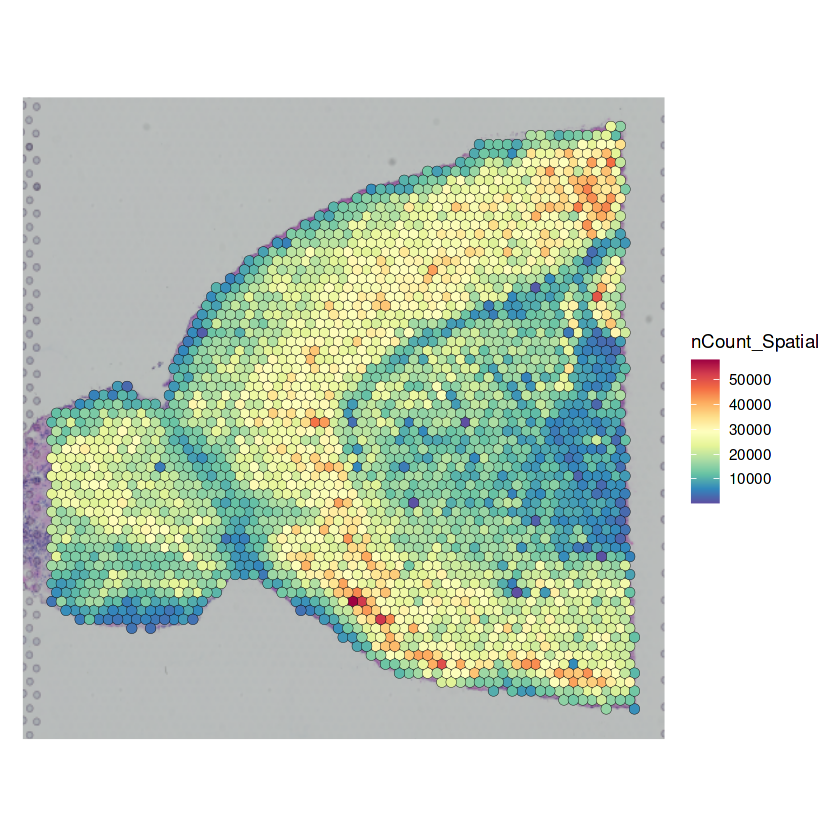

In [9]:
plot4 <- SpatialFeaturePlot(brain3, features = "nCount_Spatial") + theme(legend.position = "right")
plot4

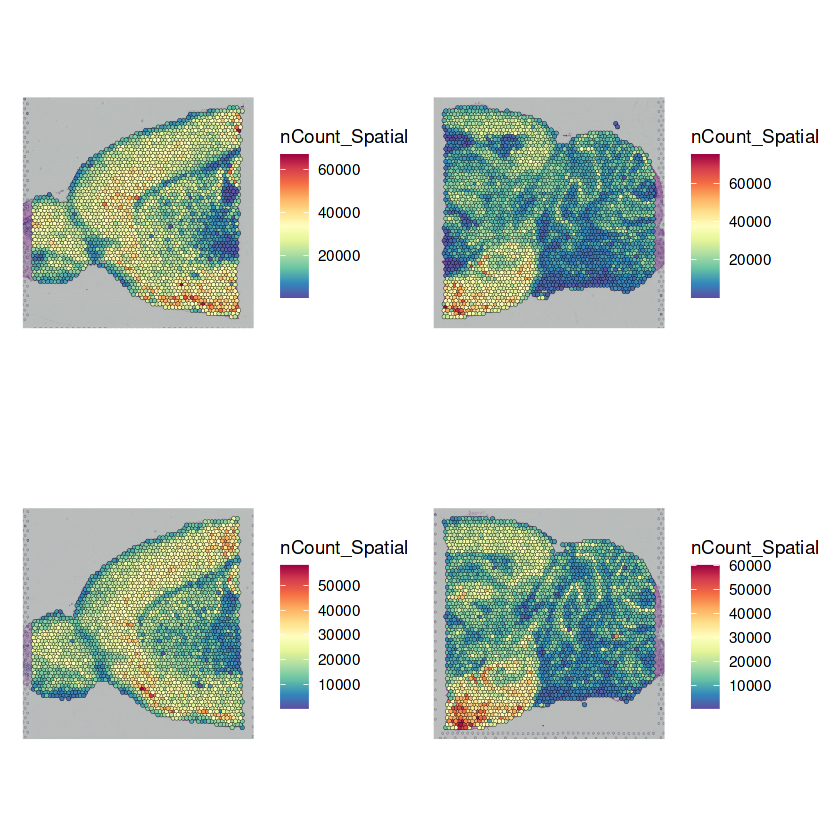

In [26]:
wrap_plots(plot2,plot3,plot4,plot5, nrow=2,ncol=2)

In [2]:
getwd()

[1] "/workspace/spatial_integration"

In [16]:
start_time = Sys.time()
# Sys.sleep(60)
end_time = Sys.time()
duration = end_time - start_time

print(start_time)
print(end_time)
print(duration)

[1] "2023-09-05 15:07:33 KST"
[1] "2023-09-05 15:07:33 KST"
Time difference of 0.0006859303 secs


In [17]:
# D1=readRDS('/home/spatial_integration/spatialLIBD/r_lib/assay_151507.rds')
# D2=readRDS('spatialLIBD/r_lib/assay_151672.rds')
# D3=readRDS('spatialLIBD/r_lib/assay_151673.rds')

# BATCH=c(rep('D1',ncol(D1)),
#         rep('D2',ncol(D2)),
#         rep('D3',ncol(D3)) )

# D12=.simple_combine(D1,D2)$combine
# D123=.simple_combine(D12,D3)$combine

# DATA = D123

# rm(D1);rm(D2);rm(D3);rm(D12)

In [30]:
spe_all <- readRDS('dataset/spe_all.rds')

In [31]:
spe_all

class: SpatialExperiment 
dim: 33538 47681 
metadata(0):
assays(2): counts logcounts
rownames(33538): ENSG00000243485 ENSG00000237613 ... ENSG00000277475
  ENSG00000268674
rowData names(9): source type ... gene_search is_top_hvg
colnames(47681): AAACAACGAATAGTTC-1 AAACAAGTATCTCCCA-1 ...
  TTGTTTCCATACAACT-1 TTGTTTGTGTAAATTC-1
colData names(69): sample_id Cluster ... array_row array_col
reducedDimNames(6): PCA TSNE_perplexity50 ... TSNE_perplexity80
  UMAP_neighbors15
mainExpName: NULL
altExpNames(0):
spatialCoords names(2) : pxl_col_in_fullres pxl_row_in_fullres
imgData names(4): sample_id image_id data scaleFactor

In [6]:
start_time <- Sys.time()

D1=readRDS('dataset/df_logcount_507.rds')
D2=readRDS('dataset/df_logcount_672.rds')
D3=readRDS('dataset/df_logcount_673.rds')
# DATA = read.csv('dataset/datapoints/embed_all_com3_unfil.csv')
end_time <- Sys.time()
duration <- end_time - start_time
print(duration)

Time difference of 9.697265 secs


In [7]:
D12=.simple_combine(D1,D2)$combine
D123=.simple_combine(D12,D3)$combine

DATA = D123

In [32]:
spe_507 <- spe_all[, spe_all$sample_id == '151507']
spe_672 <- spe_all[, spe_all$sample_id == '151672']
spe_673 <- spe_all[, spe_all$sample_id == '151673']

In [42]:
colData(spe_507)

DataFrame with 4226 rows and 69 columns
                     sample_id   Cluster   sum_umi  sum_gene     subject
                   <character> <integer> <numeric> <integer> <character>
AAACAACGAATAGTTC-1      151507         6       948       727      Br5292
AAACAAGTATCTCCCA-1      151507         3      4261      2170      Br5292
AAACAATCTACTAGCA-1      151507         2      1969      1093      Br5292
AAACACCAATAACTGC-1      151507         5      3368      1896      Br5292
AAACAGCTTTCAGAAG-1      151507         1      2981      1620      Br5292
...                        ...       ...       ...       ...         ...
TTGTTGTGTGTCAAGA-1      151507         1      2337      1320      Br5292
TTGTTTCACATCCAGG-1      151507         3      2331      1444      Br5292
TTGTTTCATTAGTCTA-1      151507         6       819       629      Br5292
TTGTTTCCATACAACT-1      151507         3      3092      1697      Br5292
TTGTTTGTGTAAATTC-1      151507         2      2390      1295      Br5292
           

In [49]:
spi <- getImg(spe_507)
spi

600 x 600 (width x height) RemoteSpatialImage
imgSource():
  https://spatial-dlpfc.s3.us-east-2.amazonaws.com/images/151507_tissue_lowres_ima
  ge.png 

In [55]:
img <- imgRaster(spi)
as.matrix(img)

#abafaeff,#abafaeff,#abafaeff,#abafaeff,#abb0aeff,#acb0aeff,#abafaeff,#abafaeff,#abafadff,#acb0aeff,⋯,#acb1aeff,#abafadff,#adb0afff,#acb0aeff,#acb0aeff,#acb0aeff,#acb0afff,#acb0aeff,#adb0afff,#acb0afff
#acafaeff,#abafaeff,#abafaeff,#abafaeff,#acb0afff,#abafaeff,#a9aeadff,#a9aeacff,#abafaeff,#abafaeff,⋯,#acb0aeff,#abafadff,#acb0afff,#acb0aeff,#abb0aeff,#acb0aeff,#acb0aeff,#acb0aeff,#acb0aeff,#acb1aeff
#abafaeff,#abafaeff,#abafaeff,#abb0aeff,#abafaeff,#aaaeacff,#a8acabff,#a8acabff,#aaaeadff,#acb0afff,⋯,#acb0afff,#acb0afff,#acb0aeff,#acb0aeff,#abb0adff,#acafaeff,#acafaeff,#abafaeff,#acb0afff,#acb1afff
#abafaeff,#abafaeff,#abb0aeff,#aaafadff,#aaaeadff,#a8acabff,#a8acabff,#a9adabff,#aaafaeff,#adb1b0ff,⋯,#acb0afff,#acb0aeff,#acb0aeff,#acb0aeff,#abb0aeff,#acb0aeff,#abafaeff,#acb0aeff,#acb0afff,#acb1aeff
#acb0aeff,#acafaeff,#abafaeff,#aaaeadff,#aaaeacff,#a8adacff,#a9adabff,#aaaeadff,#acb0afff,#adb1b0ff,⋯,#acb0aeff,#abb0aeff,#acb0aeff,#acb0aeff,#acb0aeff,#acb0aeff,#acb0aeff,#acb0aeff,#acb0afff,#acb1afff
#acb0aeff,#abb0aeff,#abafaeff,#abafaeff,#aaaeadff,#aaaeadff,#abafaeff,#acb0afff,#adb1b0ff,#adb1b0ff,⋯,#abb0aeff,#abb0adff,#acb0afff,#abb0aeff,#acafaeff,#acafaeff,#acb0aeff,#acb0aeff,#adb0afff,#acb1afff
#adb1afff,#adb1afff,#abafaeff,#acb0aeff,#acb0aeff,#acb0afff,#adb1afff,#adb1b0ff,#adb1afff,#adb1b0ff,⋯,#a9afadff,#aaafadff,#acafaeff,#acb0aeff,#acafaeff,#acb0aeff,#acb0afff,#acb0afff,#acb0aeff,#adb1afff
#a8acaaff,#a7aba9ff,#aaaeacff,#acb0aeff,#adb1afff,#aaafadff,#aaaeacff,#abb0aeff,#adb1b0ff,#adb1afff,⋯,#a9aeacff,#aaaeadff,#acafaeff,#acb0aeff,#acb0aeff,#acb0afff,#adb0afff,#adb0aeff,#adb1afff,#adb1aeff
#9ea19fff,#9da09eff,#a4a8a7ff,#acb0afff,#aaaeadff,#a5a8a7ff,#a3a7a6ff,#a7aba9ff,#acb1afff,#adb1afff,⋯,#a9aeacff,#aaaeadff,#acb0afff,#acb0aeff,#acb0afff,#acb0aeff,#acb0aeff,#acb0afff,#acb1afff,#acb1aeff
#949998ff,#969a99ff,#a1a5a4ff,#acb0afff,#a8acabff,#a0a5a4ff,#a0a4a2ff,#a2a6a4ff,#aaafacff,#aeb1b0ff,⋯,#abb0aeff,#acb0aeff,#acb0afff,#acb0aeff,#acb0aeff,#acb0afff,#adb0afff,#acb0aeff,#adb1afff,#acb1afff
#909493ff,#8f9392ff,#9fa3a2ff,#aeb2b0ff,#aaaeadff,#a3a7a5ff,#a0a4a2ff,#a4a9a7ff,#abafacff,#adb1afff,⋯,#acb1aeff,#acb0aeff,#acb0afff,#acb0aeff,#acafaeff,#acb0aeff,#abafadff,#aaaeacff,#abafadff,#acb1afff


In [63]:
imgData(spe_all)

DataFrame with 12 rows and 4 columns
      sample_id    image_id   data scaleFactor
    <character> <character> <list>   <numeric>
1        151507      lowres   ####   0.0450045
2        151508      lowres   ####   0.0450045
3        151509      lowres   ####   0.0450045
4        151510      lowres   ####   0.0450045
5        151669      lowres   ####   0.0450045
...         ...         ...    ...         ...
8        151672      lowres   ####   0.0450045
9        151673      lowres   ####   0.0450045
10       151674      lowres   ####   0.0450045
11       151675      lowres   ####   0.0450045
12       151676      lowres   ####   0.0450045

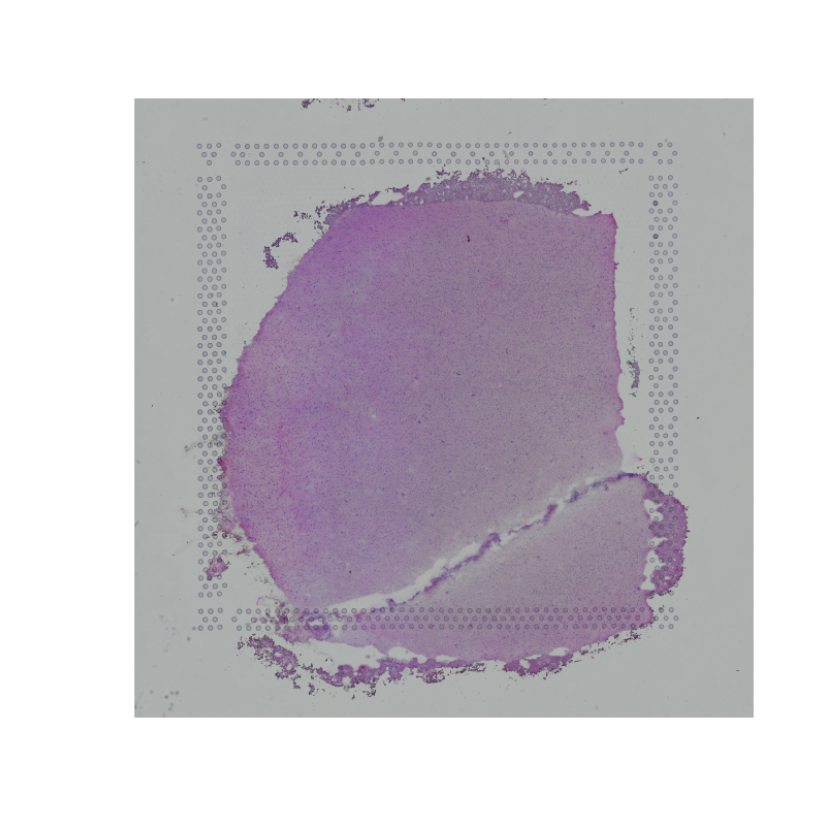

In [73]:
plot(imgRaster(mirrorImg(rotateImg(spi,+180),'v')))

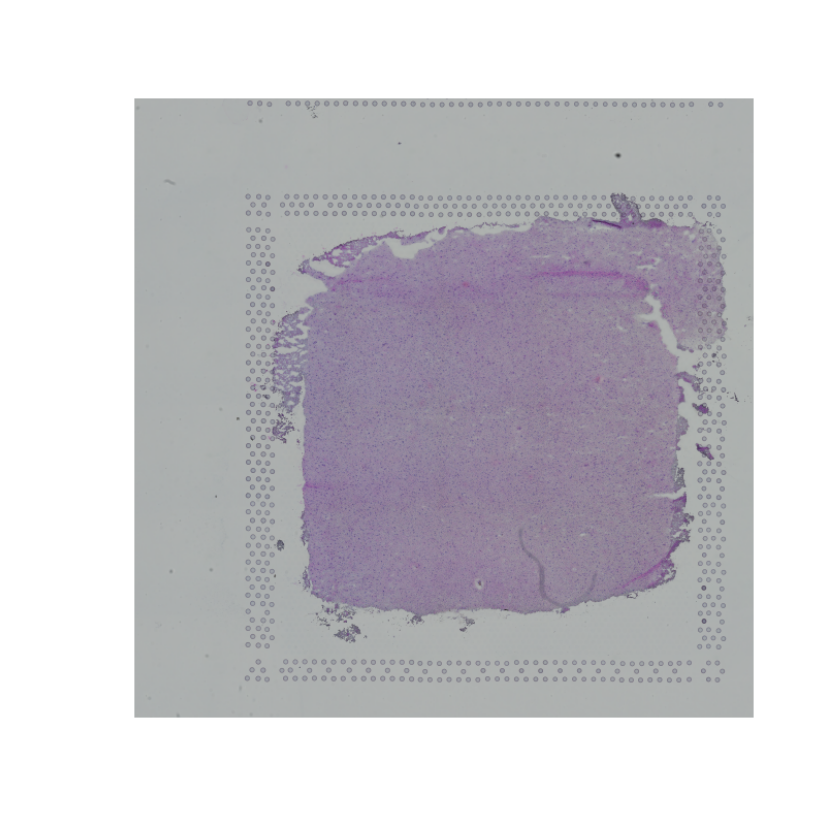

In [64]:
plot(imgRaster(getImg(spe_672)))

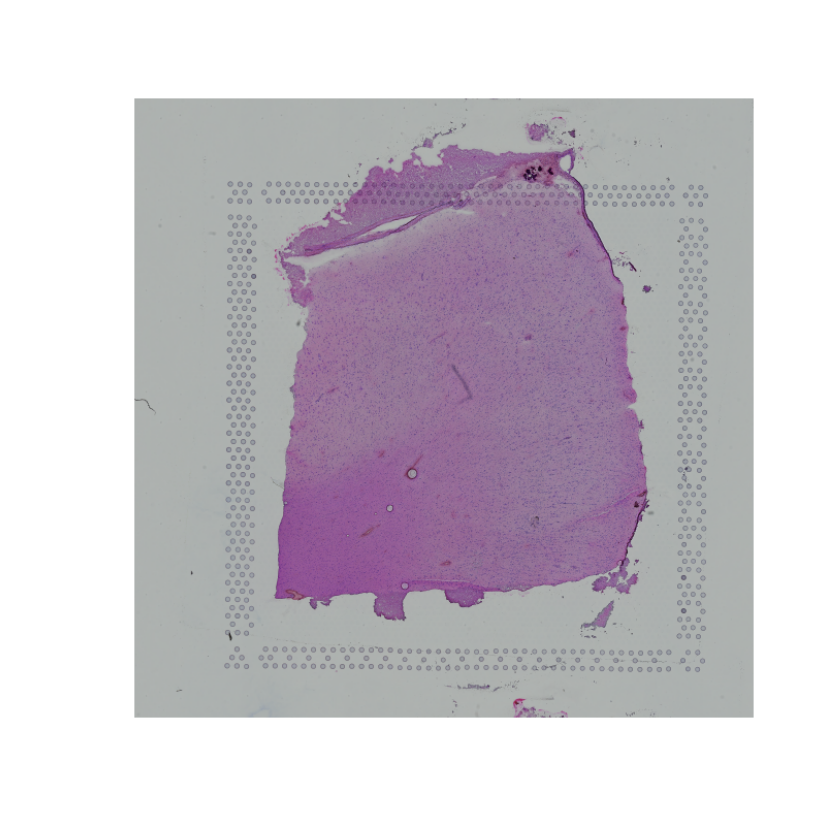

In [65]:
plot(imgRaster(getImg(spe_673)))

In [69]:
typeof(imgRaster(getImg(spe_673)))

[1] "character"

In [33]:
LAYER=c(colData(spe_507)$'layer_guess',
        colData(spe_672)$'layer_guess',
       colData(spe_673)$'layer_guess')

In [34]:
class(LAYER)

[1] "factor"

In [35]:
char_layer <- as.character(LAYER)
# char_layer

In [36]:
class(char_layer)
length(char_layer)

[1] "character"

[1] 11880

In [37]:
BATCH=c(rep('D1',ncol(D1)),
        rep('D2',ncol(D2)),
        rep('D3',ncol(D3)) )


ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'ncol': object 'D1' not found


In [14]:
D1

,AAACAACGAATAGTTC-1,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCACTACACAGAT-1,AAACCCGAACGAAATC-1,⋯,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTCTAGATACGCT-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTGTAAATTC-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000237613,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000186092,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000238009,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000239945,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000239906,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000241599,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000236601,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0
ENSG00000284733,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0,0.0000000,0.000000,0,0.000000,0,0.000000,0,0.000000,0


In [15]:
D2

,AAACAAGTATCTCCCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACATTTCCCGGATT-1,AAACCACTACACAGAT-1,AAACCCGAACGAAATC-1,AAACCGGAAATGTTAA-1,AAACCGGGTAGGTACC-1,⋯,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTCTAGATACGCT-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTGTAAATTC-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000237613,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000186092,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000238009,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000239945,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000239906,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000241599,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000236601,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000
ENSG00000284733,0.0000000,0.00000,0.000000,0,0.000000,0,0.0000000,0.000000,0.0000000,0.000000,⋯,0,0,0.0000000,0.0000000,0,0,0,0,0.000000,0.0000000


In [16]:
D3

,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCCGAACGAAATC-1,AAACCGGGTAGGTACC-1,⋯,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTATTACACG-1,TTGTTTGTGTAAATTC-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000237613,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000186092,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000238009,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239945,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239906,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000241599,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000236601,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000284733,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000


In [17]:
DATA

,AAACAACGAATAGTTC-1,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCACTACACAGAT-1,AAACCCGAACGAAATC-1,⋯,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTATTACACG-1,TTGTTTGTGTAAATTC-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000000003,0,0.0000000,0,0,0.000000,0.0000000,0.000000,0.0000000,0.5930771,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.0000000
ENSG00000000005,0,0.0000000,0,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.0000000
ENSG00000000419,0,0.0000000,0,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,1.412738,0.000000,0.0000000
ENSG00000000457,0,0.0000000,0,0,0.000000,0.8240501,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.0000000
ENSG00000000460,0,0.0000000,0,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.0000000
ENSG00000000938,0,0.0000000,0,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.0000000
ENSG00000000971,0,0.0000000,0,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.0000000
ENSG00000001036,0,0.0000000,0,0,0.000000,0.0000000,0.000000,0.8025096,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.0000000
ENSG00000001084,0,0.8417394,0,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.767643,0.0000000,0.0000000,0.000000,0.000000,0.000000,0.000000,0.5685242


In [18]:
DATA

X,AAACAACGAATAGTTC.1,AAACAAGTATCTCCCA.1,AAACAATCTACTAGCA.1,AAACACCAATAACTGC.1,AAACAGCTTTCAGAAG.1,AAACAGGGTCTATATT.1,AAACAGTGTTCCTGGG.1,AAACATTTCCCGGATT.1,AAACCACTACACAGAT.1,⋯,TTGTGTATGCCACCAA.1.2,TTGTGTTTCCCGAAAG.1.2,TTGTTAGCAAATTCGA.1.2,TTGTTCAGTGTGCTAC.1.2,TTGTTGTGTGTCAAGA.1.2,TTGTTTCACATCCAGG.1.2,TTGTTTCATTAGTCTA.1.2,TTGTTTCCATACAACT.1.2,TTGTTTGTATTACACG.1,TTGTTTGTGTAAATTC.1.2
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000237613,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000186092,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000238009,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239945,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239906,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000241599,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000236601,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000284733,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000


In [19]:
rownames(DATA) = DATA$X
DATA

,X,AAACAACGAATAGTTC.1,AAACAAGTATCTCCCA.1,AAACAATCTACTAGCA.1,AAACACCAATAACTGC.1,AAACAGCTTTCAGAAG.1,AAACAGGGTCTATATT.1,AAACAGTGTTCCTGGG.1,AAACATTTCCCGGATT.1,AAACCACTACACAGAT.1,⋯,TTGTGTATGCCACCAA.1.2,TTGTGTTTCCCGAAAG.1.2,TTGTTAGCAAATTCGA.1.2,TTGTTCAGTGTGCTAC.1.2,TTGTTGTGTGTCAAGA.1.2,TTGTTTCACATCCAGG.1.2,TTGTTTCATTAGTCTA.1.2,TTGTTTCCATACAACT.1.2,TTGTTTGTATTACACG.1,TTGTTTGTGTAAATTC.1.2
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,ENSG00000243485,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000237613,ENSG00000237613,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000186092,ENSG00000186092,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000238009,ENSG00000238009,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239945,ENSG00000239945,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239906,ENSG00000239906,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000241599,ENSG00000241599,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000236601,ENSG00000236601,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000284733,ENSG00000284733,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000


In [20]:
DATA$X <- NULL
DATA

,AAACAACGAATAGTTC.1,AAACAAGTATCTCCCA.1,AAACAATCTACTAGCA.1,AAACACCAATAACTGC.1,AAACAGCTTTCAGAAG.1,AAACAGGGTCTATATT.1,AAACAGTGTTCCTGGG.1,AAACATTTCCCGGATT.1,AAACCACTACACAGAT.1,AAACCCGAACGAAATC.1,⋯,TTGTGTATGCCACCAA.1.2,TTGTGTTTCCCGAAAG.1.2,TTGTTAGCAAATTCGA.1.2,TTGTTCAGTGTGCTAC.1.2,TTGTTGTGTGTCAAGA.1.2,TTGTTTCACATCCAGG.1.2,TTGTTTCATTAGTCTA.1.2,TTGTTTCCATACAACT.1.2,TTGTTTGTATTACACG.1,TTGTTTGTGTAAATTC.1.2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000237613,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000186092,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000238009,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239945,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239906,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000241599,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000236601,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000284733,0.000000,0.0000000,0,0.000000,0.000000,0,0,0.0000000,0,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000


In [18]:
length(BATCH)

[1] 11880

In [19]:
class(BATCH)

[1] "character"

In [20]:
dim(D1)
dim(D2)
dim(D3)
dim(DATA)
# dim(dummy_dat)

[1] 33538  4226

[1] 33538  4015

[1] 33538  3639

[1] 33538 11880

In [21]:
mybeer=BEER(DATA, BATCH, GNUM=50, PCNUM=30, ROUND=2, GN=1000, SEED=1, COMBAT=TRUE)

[1] "BEER start!"
[1] "2023-08-30 10:48:47 KST"


Loading required package: stringi



[1] "Group number (GNUM) is:"
[1] 50
[1] "Varible gene number (GN) of each batch is:"
[1] 1000
[1] "ROUND is:"
[1] 2
[1] 1
[1] "D1"
[1] 2
[1] "D2"
[1] 3
[1] "D3"
[1] "Total varible gene number (GN) is:"
[1] 2520


Warning message:
“Non-unique cell names (colnames) present in the input matrix, making unique”


Found 260 genes with uniform expression within a single batch (all zeros); these will not be adjusted for batch.


Found3batches

Adjusting for0covariate(s) or covariate level(s)

Standardizing Data across genes

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting the Data


Centering and scaling data matrix



[1] "Calculating PCs ..."


PC_ 1 
Positive:  ENSG00000123560 
Negative:  ENSG00000171617 

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
10:49:21 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

10:49:21 Read 11880 rows and found 30 numeric columns

10:49:21 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

10:49:21 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

[1] "Get group for:"
[1] "D1"
[1] "Group Number:"
[1] 50
[1] "Get group for:"
[1] "D2"
[1] "Group Number:"
[1] 50
[1] "Get group for:"
[1] "D3"
[1] "Group Number:"
[1] 50
[1] "Finding MN pairs..."
[1] "1 / 150"
[1] "101 / 150"
[1] "ROUND:"
[1] 1
[1] "ROUND:"
[1] 2
[1] "Number of MN pairs:"
[1] 11
[1] "Evaluating PCs ..."
[1] "Start"


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 1


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 2


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 3


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 4


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 5


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 6


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 7


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 8


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 9


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 10


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 11


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 12


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 13


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 14


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 15


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 16


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 17


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 18


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 19


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 20


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 21


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 22


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 23


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 24


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 25


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 26


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 27


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 28


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 29


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 30
[1] "Finished!!!"
[1] "############################################################################"
[1] "BEER cheers !!! All main steps finished."
[1] "############################################################################"
[1] "2023-08-30 10:49:46 KST"


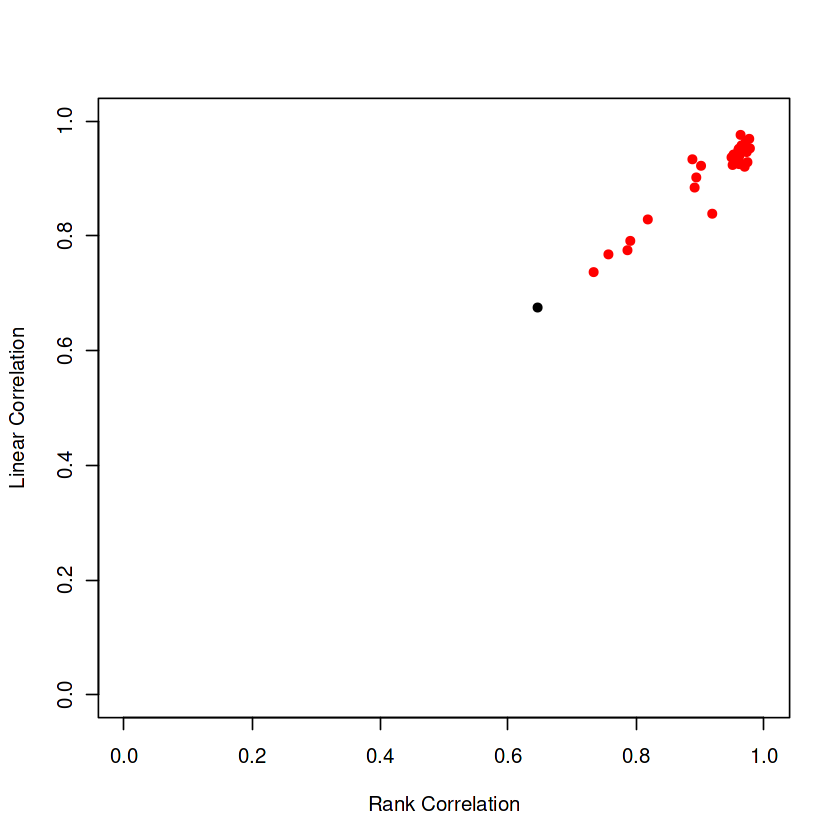

In [21]:
PCUSE=mybeer$select
COL=rep('black',length(mybeer$cor))
COL[PCUSE]='red'
plot(mybeer$cor,mybeer$lcor,pch=16,col=COL,
    xlab='Rank Correlation',ylab='Linear Correlation',xlim=c(0,1),ylim=c(0,1))

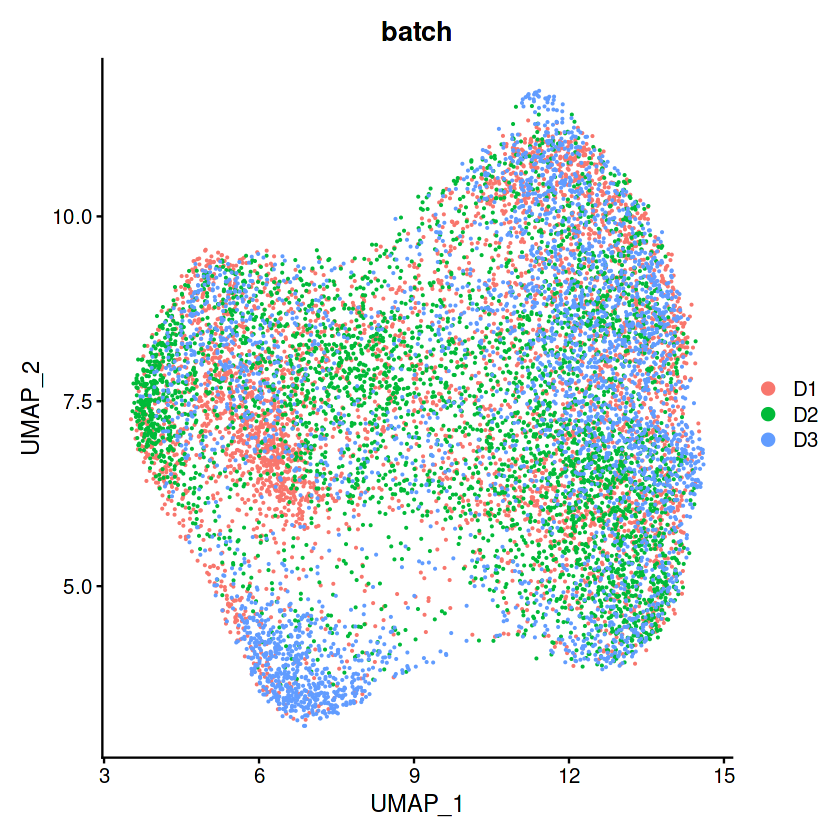

In [28]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc@meta.data$orig.ident=char_layer
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  

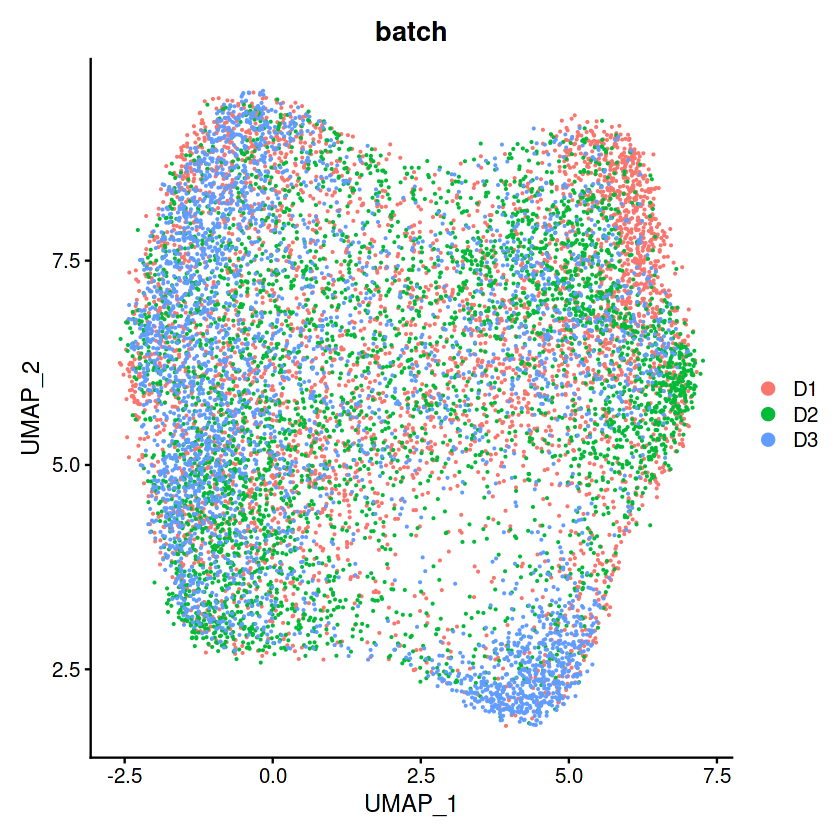

In [26]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc@meta.data$orig.ident=char_layer
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  

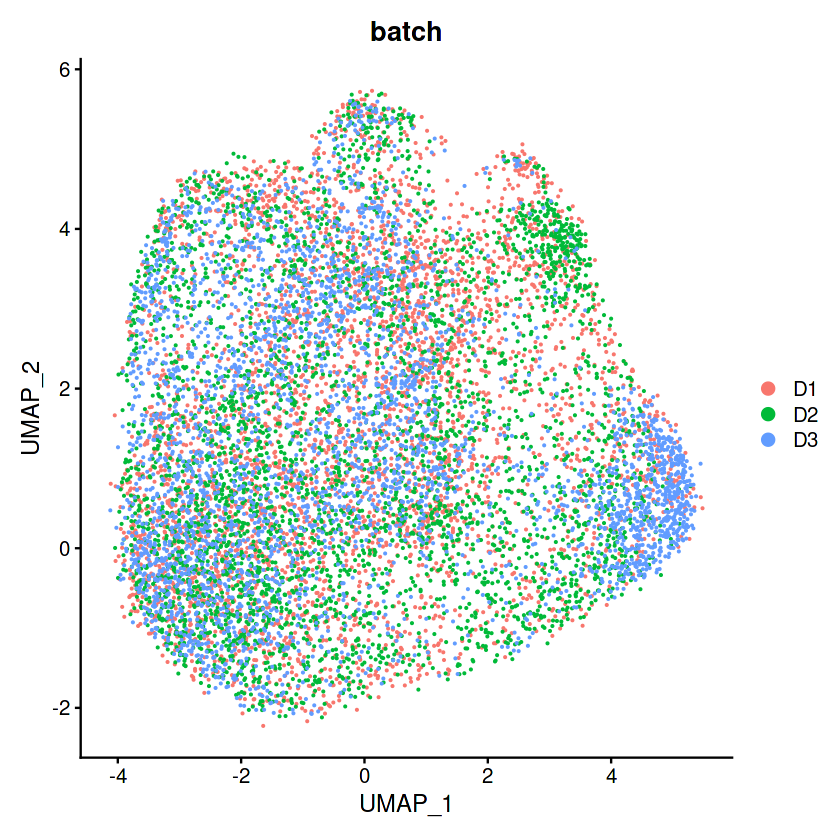

In [22]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc@meta.data$orig.ident=char_layer
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  

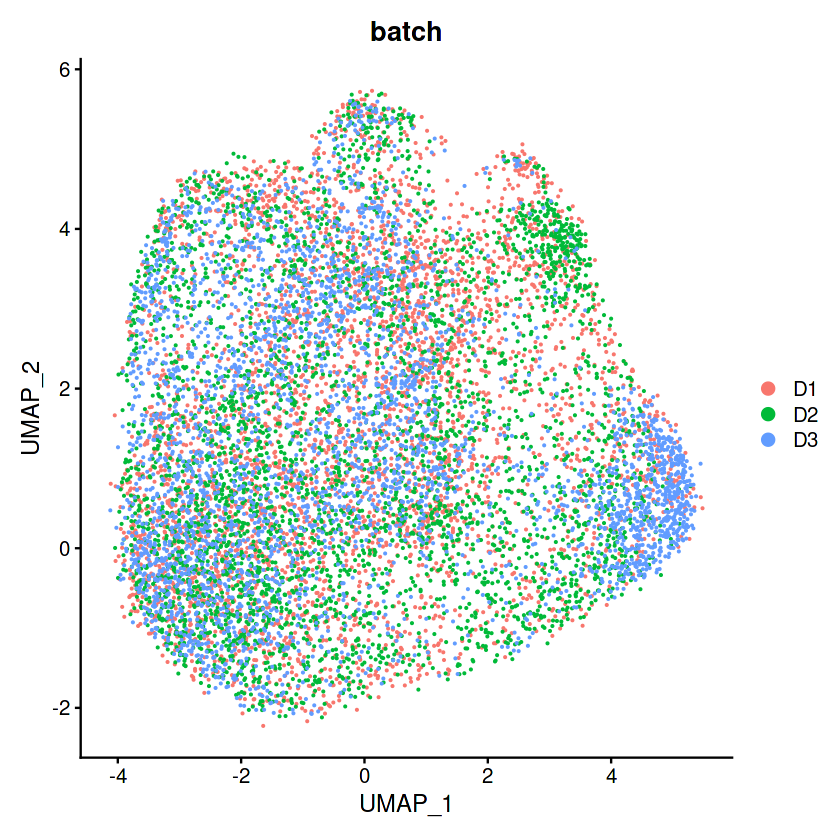

In [22]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc@meta.data$orig.ident=char_layer
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  

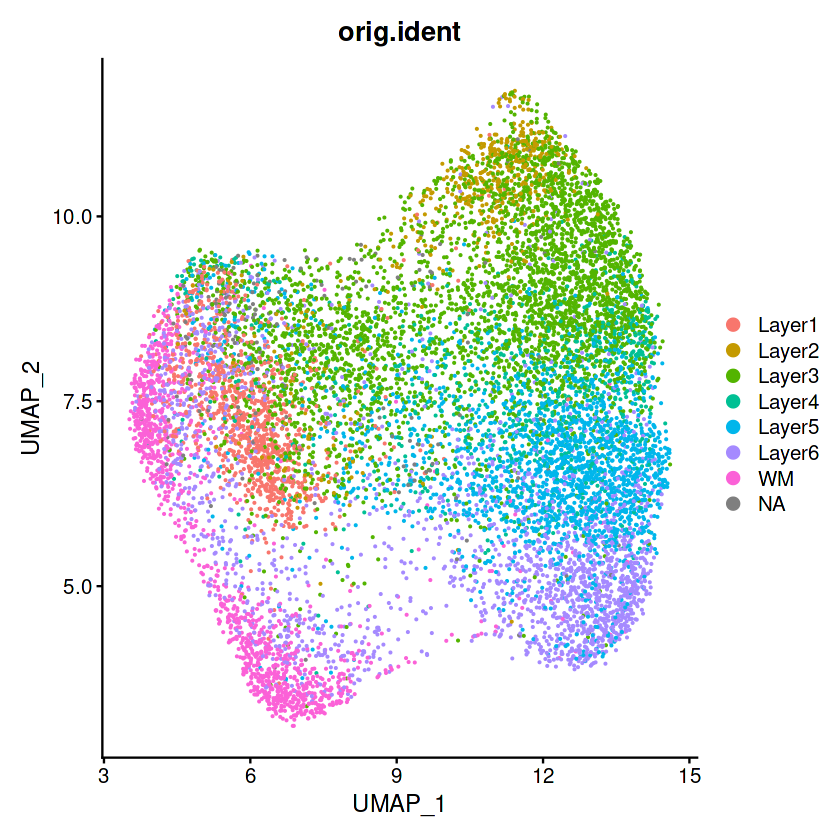

In [29]:
# pbmc <- mybeer$seurat
# PCUSE <- mybeer$select
# pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='orig.ident', pt.size=0.1)  

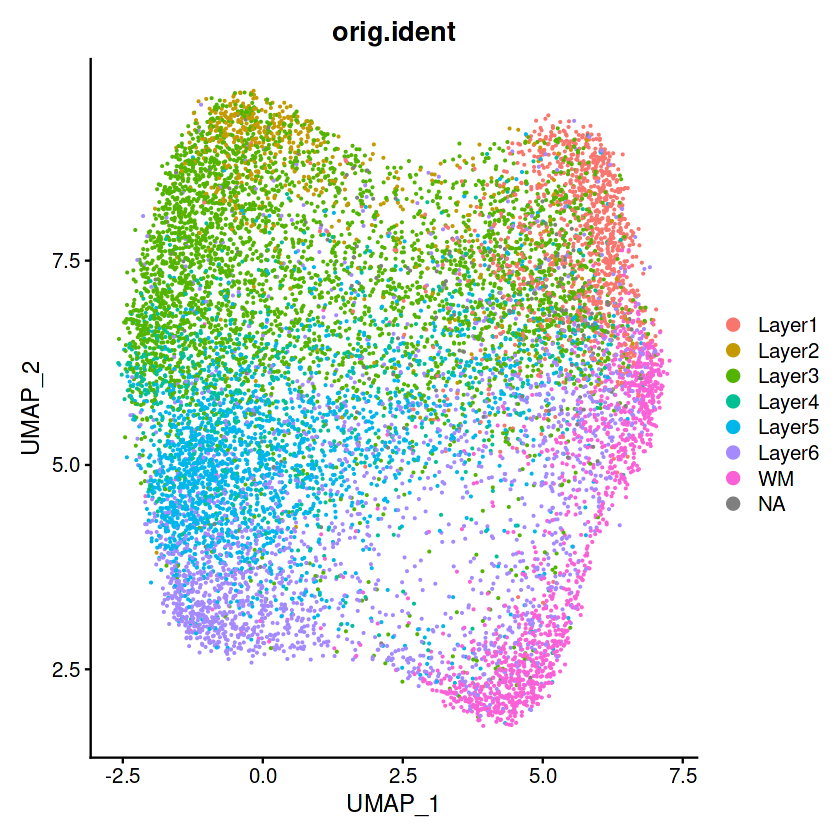

In [27]:
# pbmc <- mybeer$seurat
# PCUSE <- mybeer$select
# pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='orig.ident', pt.size=0.1)  

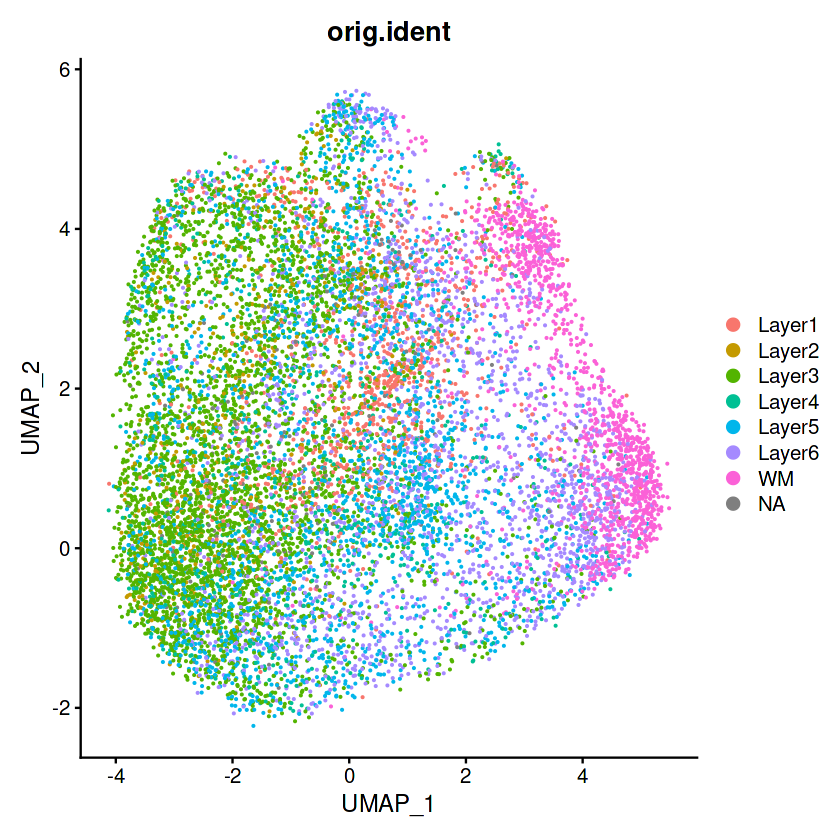

In [23]:
# pbmc <- mybeer$seurat
# PCUSE <- mybeer$select
# pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='orig.ident', pt.size=0.1)  

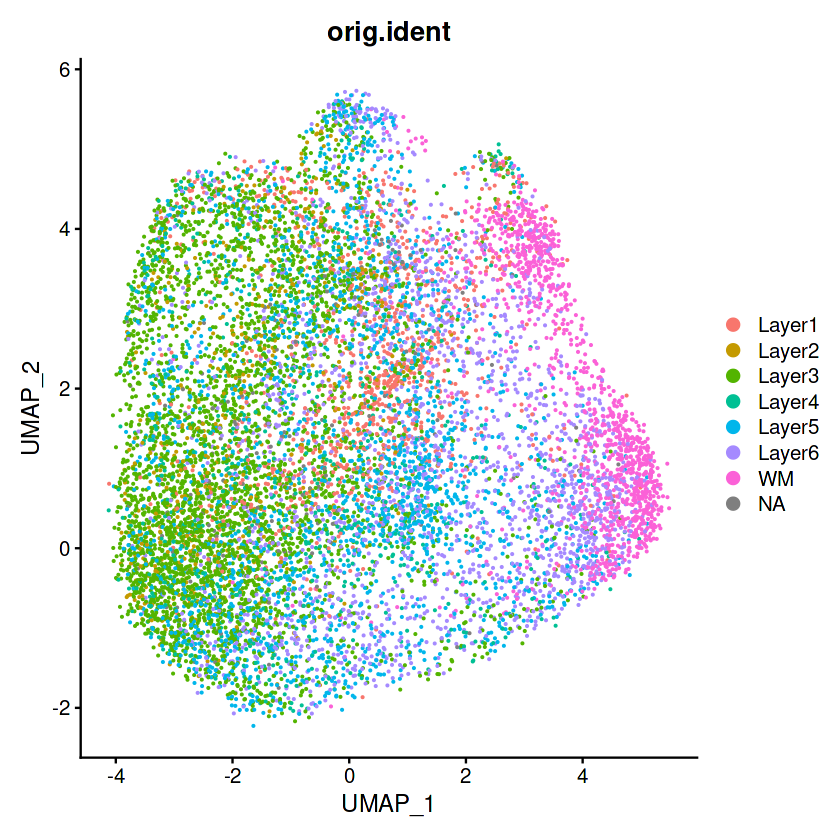

In [23]:
# pbmc <- mybeer$seurat
# PCUSE <- mybeer$select
# pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='orig.ident', pt.size=0.1)  

In [26]:
param <- 'base_umap_plot_gg_0824_gnum50_pc30_GN1000_R2.png'
par_only <- '_gnum50_pc30_GN1000_R2.png'

In [27]:
layer <- paste('layer',param,sep='_')

In [31]:
umap_plot <- DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1) 
if (file.exists(param)){
    print("File exists!")
}else{
    print(paste0("saving to: '", param, "'"))
    ggsave(param,umap_plot)
}

[1] "File exists!"


In [32]:
umap_plot <- DimPlot(pbmc, reduction='umap', group.by='orig.ident', pt.size=0.1) 
if (file.exists(layer)){
    print("File exists!")
}else{
    print(paste0("saving to: '", layer, "'"))
    ggsave(layer,umap_plot)
}

[1] "File exists!"


In [33]:
png(paste('base_corr_plot_0824',par_only))
plot(mybeer$cor,mybeer$lcor,pch=16,col=COL,
    xlab='Rank Correlation',ylab='Linear Correlation',xlim=c(0,1),ylim=c(0,1))
dev.off()

png 
  2

Centering and scaling data matrix

PC_ 1 
Positive:  3457 
Negative:  ENSG00000142192 



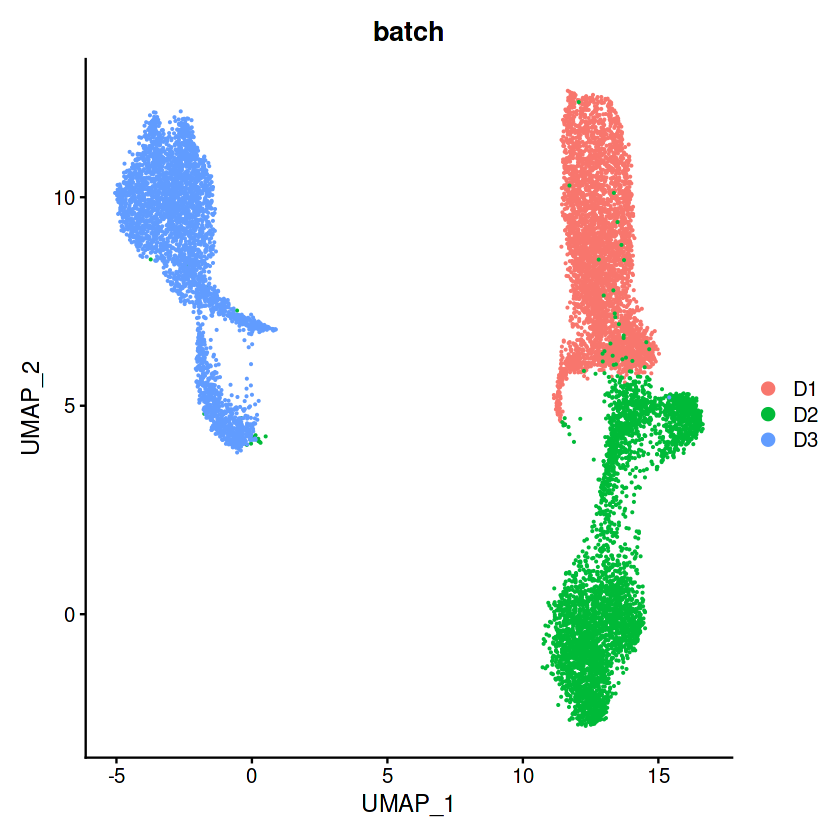

In [36]:
pbmc_batch=CreateSeuratObject(counts = DATA, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch@meta.data$orig.ident=char_layer
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Centering and scaling data matrix

PC_ 1 
Positive:  ENSG00000175874 
Negative:  ENSG00000204792-spat 



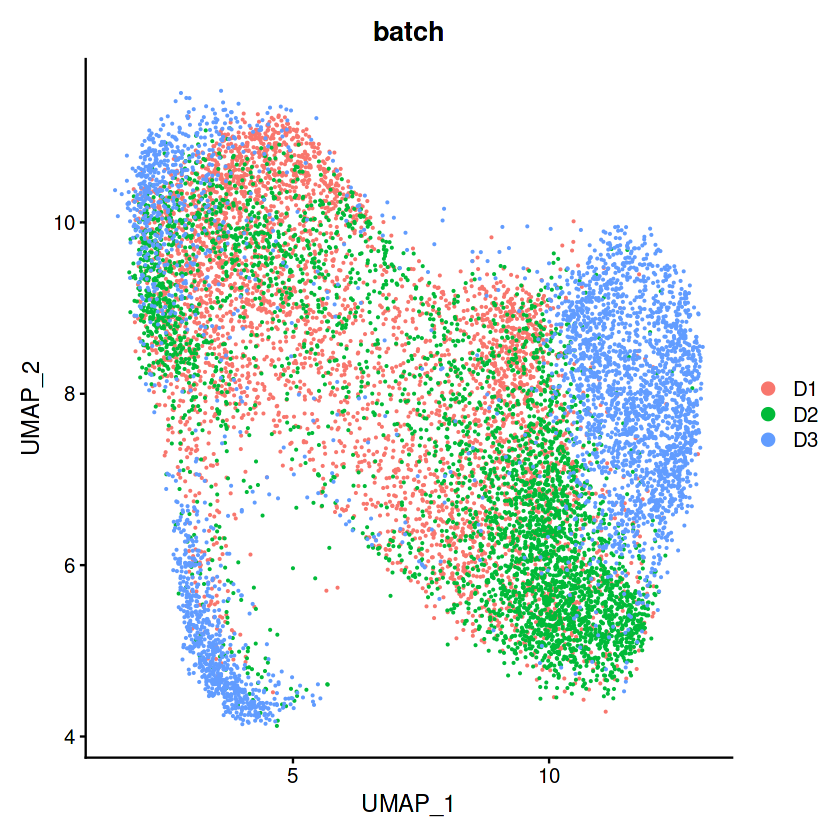

In [31]:
pbmc_batch=CreateSeuratObject(counts = DATA, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch@meta.data$orig.ident=char_layer
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

Warning message:
“Non-unique cell names (colnames) present in the input matrix, making unique”
Centering and scaling data matrix

PC_ 1 
Positive:  ENSG00000187094 
Negative:  ENSG00000168314 



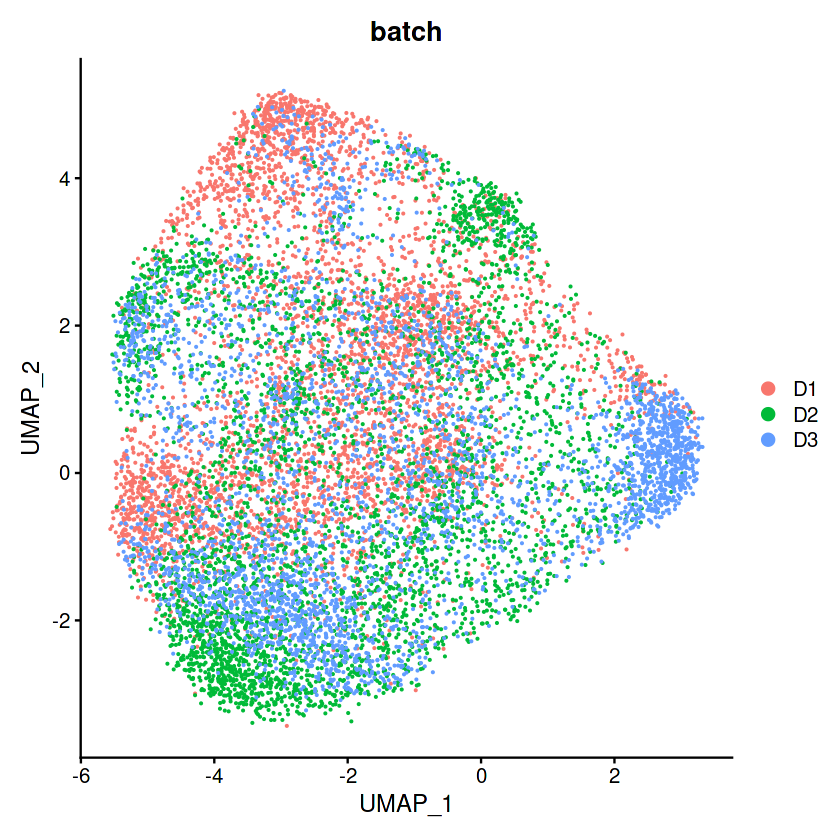

In [24]:
pbmc_batch=CreateSeuratObject(counts = DATA, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch@meta.data$orig.ident=char_layer
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

Warning message:
“Non-unique cell names (colnames) present in the input matrix, making unique”
Centering and scaling data matrix

PC_ 1 
Positive:  ENSG00000187094 
Negative:  ENSG00000168314 



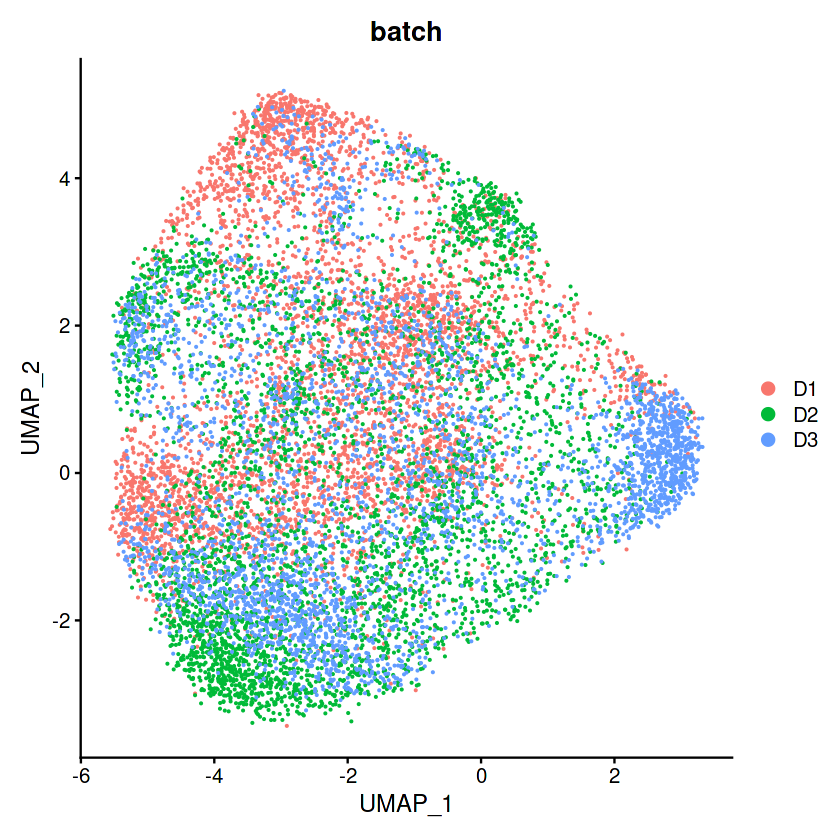

In [24]:
pbmc_batch=CreateSeuratObject(counts = DATA, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch@meta.data$orig.ident=char_layer
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

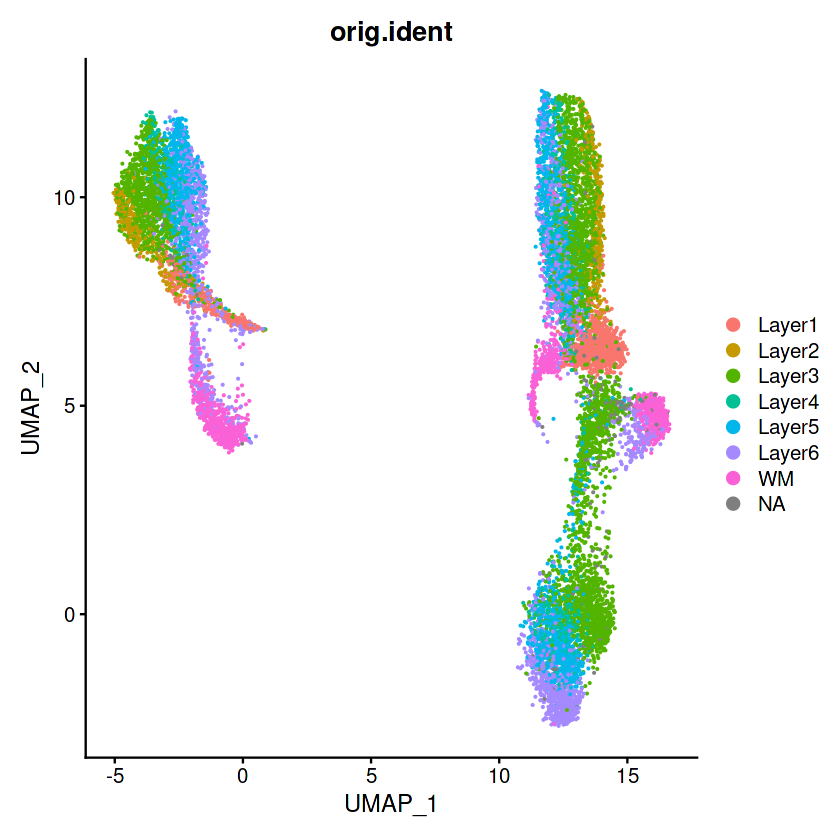

In [37]:
DimPlot(pbmc_batch, reduction='umap', group.by='orig.ident', pt.size=0.1) 

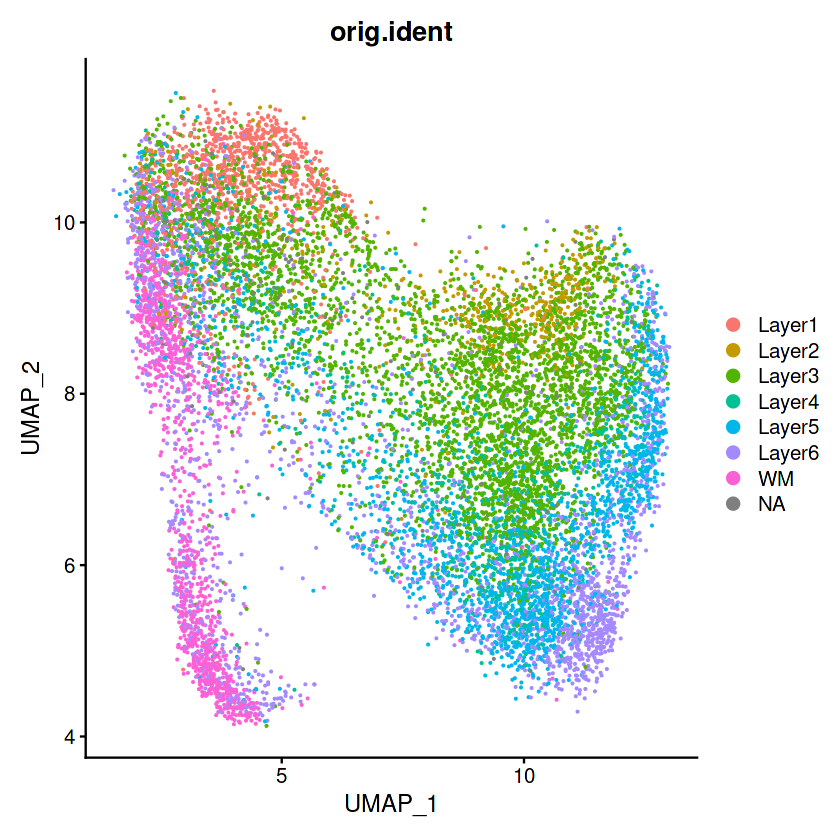

In [32]:
DimPlot(pbmc_batch, reduction='umap', group.by='orig.ident', pt.size=0.1) 

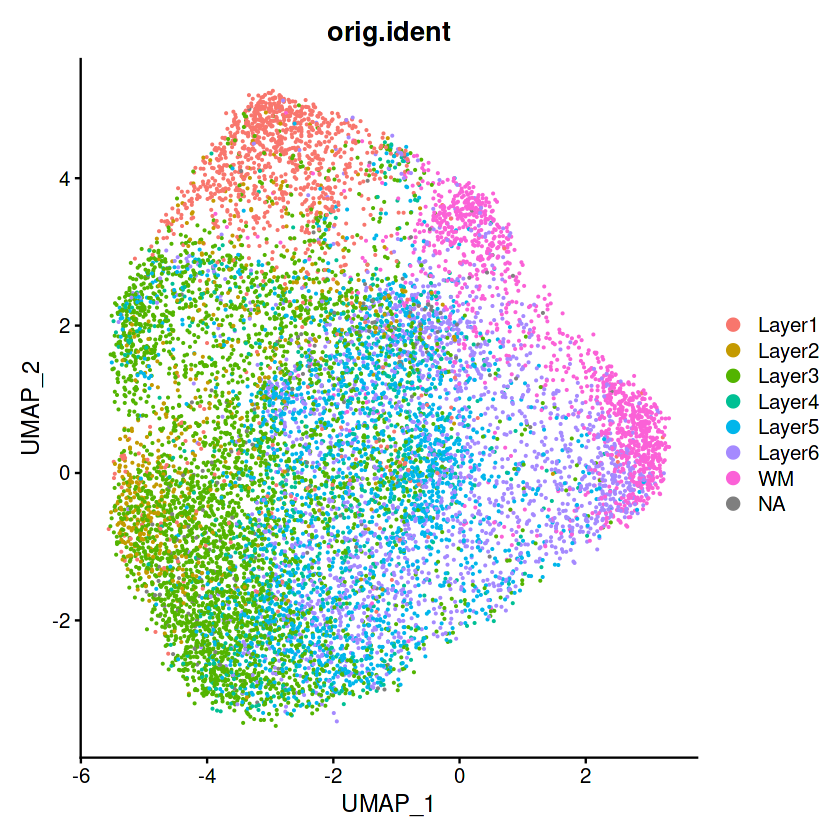

In [25]:
DimPlot(pbmc_batch, reduction='umap', group.by='orig.ident', pt.size=0.1) 

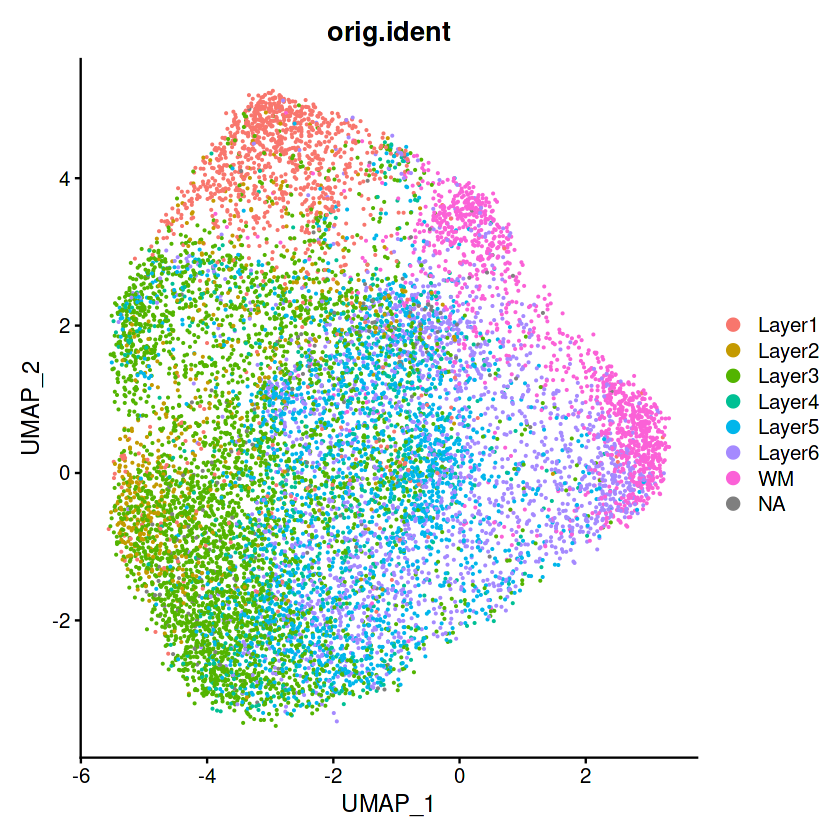

In [25]:
DimPlot(pbmc_batch, reduction='umap', group.by='orig.ident', pt.size=0.1) 

Centering and scaling data matrix

PC_ 1 
Positive:  3457 
Negative:  ENSG00000142192 



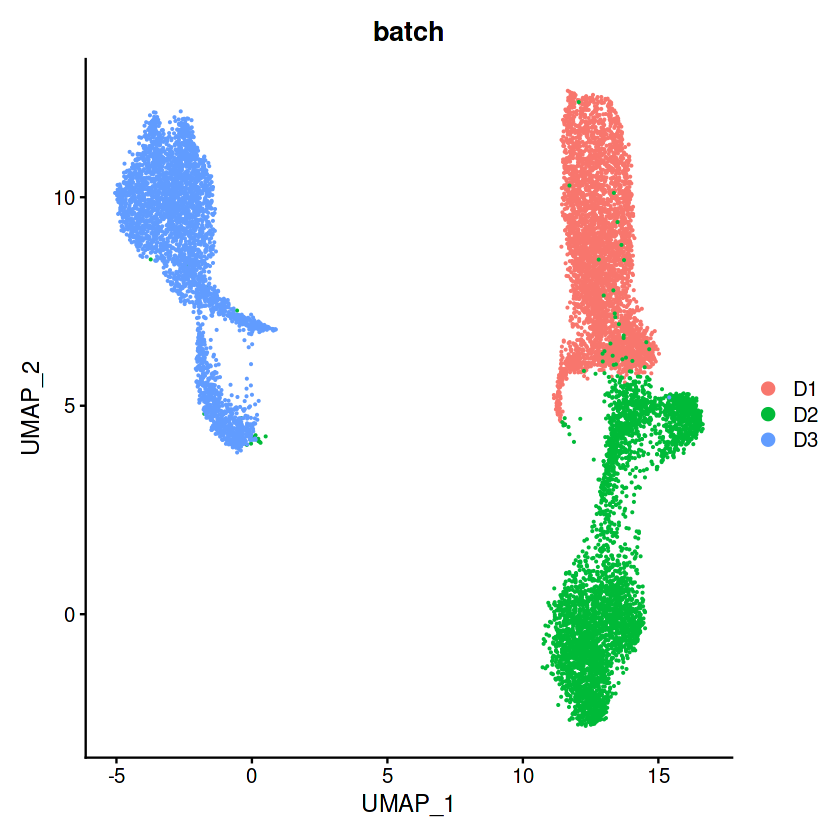

In [21]:
pbmc_batch=CreateSeuratObject(counts = DATA, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

In [27]:
file_path = 'nobatch_base_umap_plot_0830_gnum50_pc30_GN1000_R2.png'
plot_save <- DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1)
if (file.exists(file_path)){
    print("File exists!")
}else{
    print(paste0("saving to: '", file_path, "'"))
    ggsave(file_path,plot_save)
}

[1] "saving to: 'nobatch_base_umap_plot_0830_gnum50_pc30_GN1000_R2.png'"


Saving 6.67 x 6.67 in image


In [28]:
file_path = 'nobatch_layer_base_umap_plot_0830_gnum50_pc30_GN1000_R2.png'
plot_save <- DimPlot(pbmc_batch, reduction='umap', group.by='orig.ident', pt.size=0.1)
if (file.exists(file_path)){
    print("File exists!")
}else{
    print(paste0("saving to: '", file_path, "'"))
    ggsave(file_path,plot_save)
}
# ggsave('layer_com3_unfil_umap_plot_baserow_0809_gnum50_pc30_GN1000_R2.png',plot_save)

[1] "saving to: 'nobatch_layer_base_umap_plot_0830_gnum50_pc30_GN1000_R2.png'"


Saving 6.67 x 6.67 in image


In [31]:
pbmc@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,batch,group,map
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>
AAACAACGAATAGTTC.1,Layer1,4761.129,6828,D1,D1_26,NA
AAACAAGTATCTCCCA.1,Layer3,5525.503,8271,D1,D1_10,V1
AAACAATCTACTAGCA.1,Layer1,5072.243,7194,D1,D1_16,NA
AAACACCAATAACTGC.1,WM,5609.661,7997,D1,D1_4,NA
AAACAGCTTTCAGAAG.1,Layer6,5389.841,7721,D1,D1_37,NA
AAACAGGGTCTATATT.1,Layer6,5417.953,8236,D1,D1_6,NA
AAACAGTGTTCCTGGG.1,WM,5242.483,7451,D1,D1_28,NA
AAACATTTCCCGGATT.1,Layer5,5592.206,8448,D1,D1_49,NA
AAACCACTACACAGAT.1,Layer3,5629.805,9012,D1,D1_19,V1


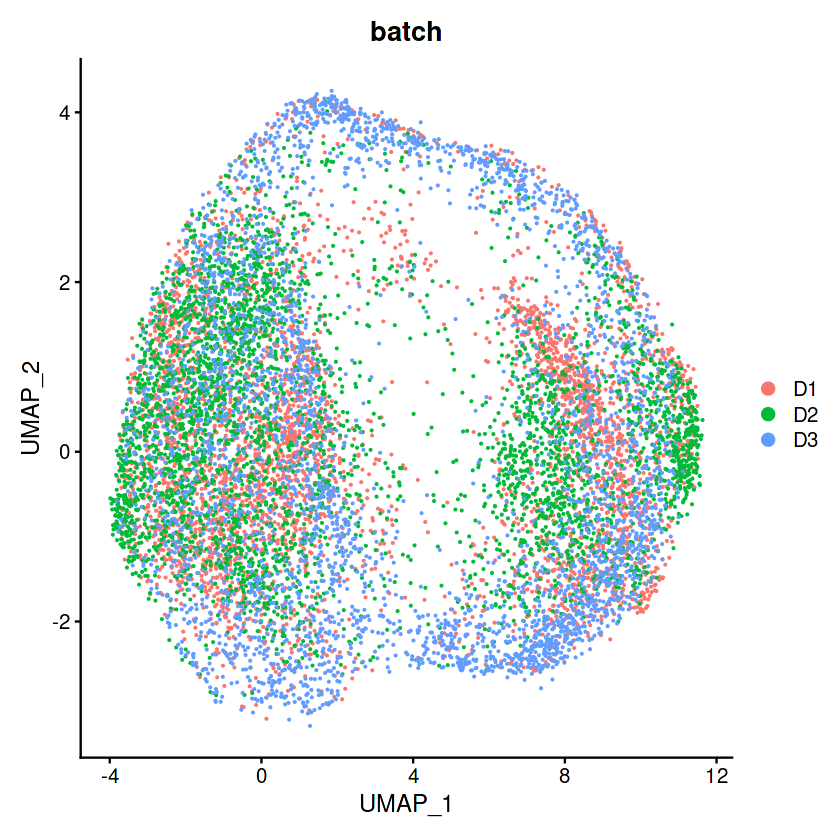

In [23]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  

In [24]:
# library(ggplot2)
umap_plot <- DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  
ggsave('umap_plot_gg.png',umap_plot)

ERROR: Error in ggsave("umap_plot_gg.png", umap_plot): could not find function "ggsave"


In [2]:
D1=readRDS('demo_BEER/MGH36.RDS')
D2=readRDS('demo_BEER/MGH53.RDS')
D3=readRDS('demo_BEER/MGH54.RDS')
D4=readRDS('demo_BEER/MGH60.RDS')
D5=readRDS('demo_BEER/MGH93.RDS')
D6=readRDS('demo_BEER/MGH97.RDS')

BATCH=c(rep('D1',ncol(D1)),
        rep('D2',ncol(D2)),
        rep('D3',ncol(D3)),
        rep('D4',ncol(D4)),
        rep('D5',ncol(D5)),
        rep('D6',ncol(D6)) )
        
D12=.simple_combine(D1,D2)$combine
D34=.simple_combine(D3,D4)$combine
D56=.simple_combine(D5,D6)$combine
D1234=.simple_combine(D12,D34)$combine
D123456=.simple_combine(D1234,D56)$combine

DATA=D123456   

# rm(D1);rm(D2);rm(D3);rm(D4);rm(D5);rm(D6)
# rm(D12);rm(D34);rm(D56);rm(D1234);rm(D123456)

[1] "BEER start!"
[1] "2023-03-09 15:55:44 KST"


Loading required package: stringi



[1] "Group number (GNUM) is:"
[1] 30
[1] "Varible gene number (GN) of each batch is:"
[1] 2000
[1] "ROUND is:"
[1] 1
[1] 1
[1] "D1"


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] 2
[1] "D2"


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] 3
[1] "D3"


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] 4
[1] "D4"


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] 5
[1] "D5"


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] 6
[1] "D6"


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


[1] "Total varible gene number (GN) is:"
[1] 4554


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


Found 991 genes with uniform expression within a single batch (all zeros); these will not be adjusted for batch.


Found6batches

Adjusting for0covariate(s) or covariate level(s)

Standardizing Data across genes

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting the Data


Centering and scaling data matrix



[1] "Calculating PCs ..."


PC_ 1 
Positive:  BCAN 
Negative:  C1QC 



[1] "Get group for:"
[1] "D1"
[1] "Group Number:"
[1] 30
[1] "Get group for:"
[1] "D2"
[1] "Group Number:"
[1] 30
[1] "Get group for:"
[1] "D3"
[1] "Group Number:"
[1] 30
[1] "Get group for:"
[1] "D4"
[1] "Group Number:"
[1] 30
[1] "Get group for:"
[1] "D5"
[1] "Group Number:"
[1] 30
[1] "Get group for:"
[1] "D6"
[1] "Group Number:"
[1] 30
[1] "Finding MN pairs..."
[1] "1 / 180"
[1] "101 / 180"
[1] "ROUND:"
[1] 1
[1] "Number of MN pairs:"
[1] 34
[1] "Evaluating PCs ..."
[1] "Start"
[1] 1
[1] 2
[1] 3
[1] 4
[1] 5
[1] 6
[1] 7
[1] 8
[1] 9
[1] 10
[1] 11
[1] 12
[1] 13
[1] 14
[1] 15
[1] 16
[1] 17
[1] 18
[1] 19
[1] 20
[1] 21
[1] 22
[1] 23
[1] 24
[1] 25
[1] 26
[1] 27
[1] 28
[1] 29
[1] 30
[1] 31
[1] 32
[1] 33
[1] 34
[1] 35
[1] 36
[1] 37
[1] 38
[1] 39
[1] 40
[1] 41
[1] 42
[1] 43
[1] 44
[1] 45
[1] 46
[1] 47
[1] 48
[1] 49
[1] 50
[1] "Finished!!!"
[1] "############################################################################"
[1] "BEER cheers !!! All main steps finished."
[1] "###################

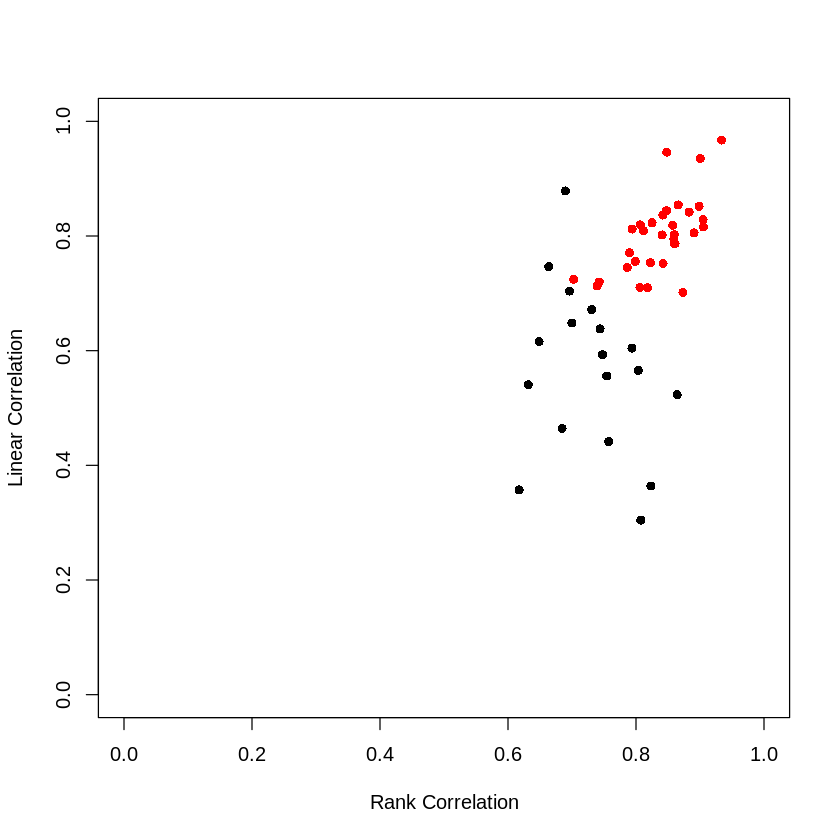

In [3]:
mybeer=BEER(DATA, BATCH, GNUM=30, PCNUM=50, ROUND=1, GN=2000, SEED=1, COMBAT=TRUE )

# Check selected PCs
PCUSE=mybeer$select
COL=rep('black',length(mybeer$cor))
COL[PCUSE]='red'
plot(mybeer$cor,mybeer$lcor,pch=16,col=COL,
    xlab='Rank Correlation',ylab='Linear Correlation',xlim=c(0,1),ylim=c(0,1))

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Centering and scaling data matrix

PC_ 1 
Positive:  LAPTM5 
Negative:  BCAN 



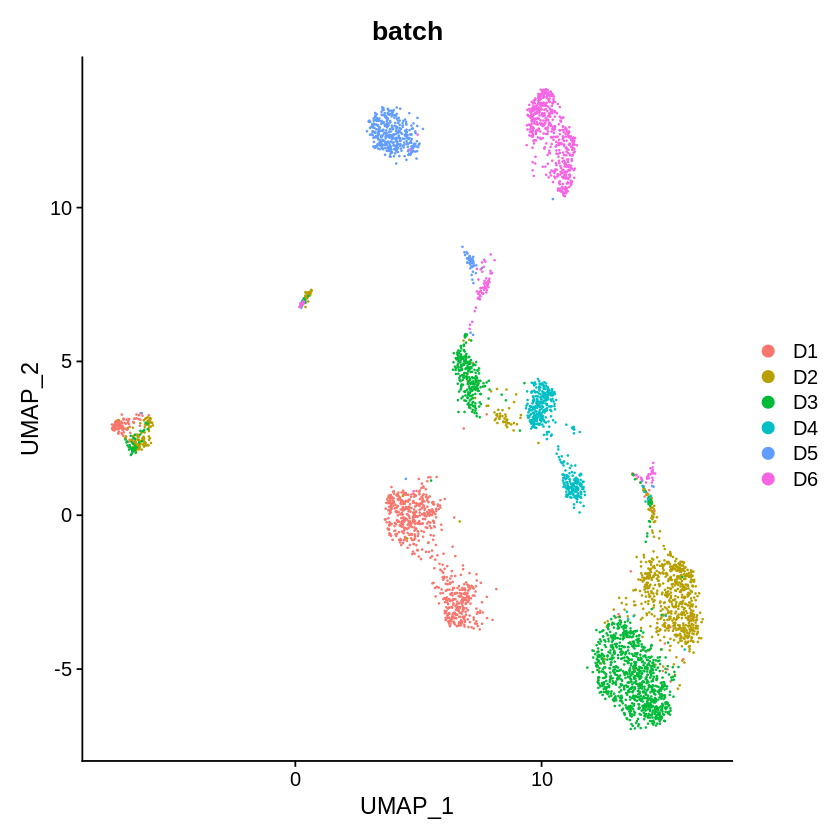

In [4]:
pbmc_batch=CreateSeuratObject(counts = DATA, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

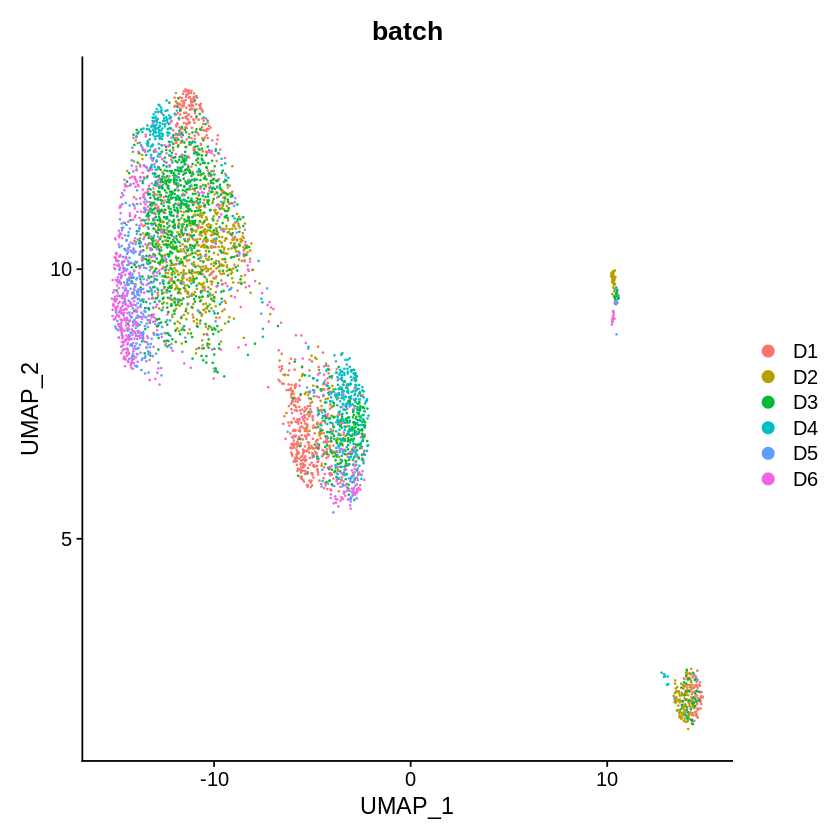

In [5]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  

Warning message:
“The following arguments are not used: check_duplicates”


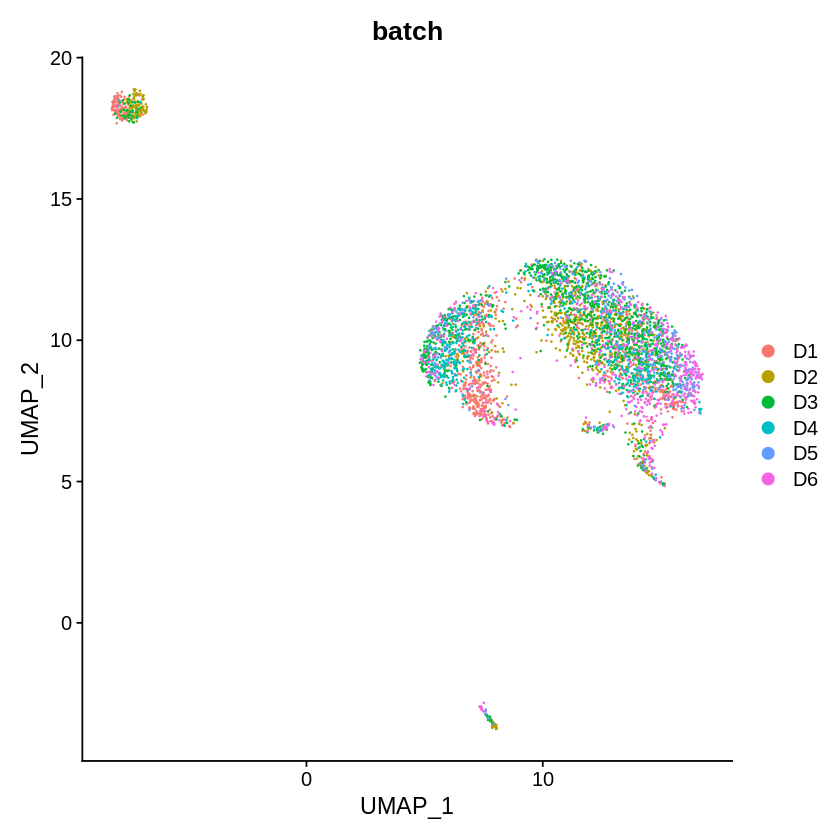

In [6]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, check_duplicates=FALSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1)  

In [ ]:
D1 <- read.table("demo_BEER/DATA1_MAT.txt", sep='\t', row.names=1, header=T)
D2 <- read.table("demo_BEER/DATA2_MAT.txt", sep='\t', row.names=1, header=T)

In [ ]:
colnames(D1)=paste0('D1_', colnames(D1))
colnames(D2)=paste0('D2_', colnames(D2))

DATA=.simple_combine(D1,D2)$combine

BATCH=rep('D2',ncol(DATA))
BATCH[c(1:ncol(D1))]='D1'

In [ ]:
mybeer=BEER(DATA, BATCH, GNUM=30, PCNUM=50, ROUND=1, GN=2000, SEED=1, COMBAT=TRUE, RMG=NULL) 

In [ ]:
PCUSE=mybeer$select
COL=rep('black',length(mybeer$cor))
COL[PCUSE]='red'
plot(mybeer$cor,mybeer$lcor,pch=16,col=COL,
    xlab='Rank Correlation',ylab='Linear Correlation',xlim=c(0,1),ylim=c(0,1))

In [ ]:
pbmc_batch=CreateSeuratObject(counts = DATA, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2)
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

In [ ]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, check_duplicates=FALSE)

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.1) 